In [1]:
pip install opencage tqdm

Note: you may need to restart the kernel to use updated packages.


In [2]:
from opencage.geocoder import OpenCageGeocode
import pandas as pd
import time
from tqdm.notebook import tqdm


In [5]:
from opencage.geocoder import OpenCageGeocode
import pandas as pd
import time
from tqdm import tqdm

# Initialize the OpenCage geolocator with your API key
api_key = 'b6fdd316759e45889d57380a9cb79217'
geolocator = OpenCageGeocode(api_key)

def get_location(lat, lon):
    try:
        result = geolocator.reverse_geocode(lat, lon)
        if result and len(result):
            return result[0]['formatted']
        else:
            return "No result"
    except Exception as e:
        return str(e)

# Load your coordinates CSV
df = pd.read_csv('coords_with_location.csv')

# Ensure the dataframe has the correct columns
df.columns = ['latitude', 'longitude', 'location']

# Find the last processed index by looking for the last valid location entry
start_index = df['location'].last_valid_index()
if start_index is None:
    start_index = 1  # start from 2nd row (index 1) since first row (index 0) has headers
else:
    start_index += 1  # continue from the next row

# Process the coordinates in batches
batch_size = 2500  # Process in batches of 2500
locations = []
for idx, row in tqdm(df.iloc[start_index:start_index + batch_size].iterrows(), total=batch_size, desc="Geocoding Progress"):
    locations.append(get_location(row['latitude'], row['longitude']))
    time.sleep(1)  # Add delay to respect rate limiting

# Update the dataframe with the new locations
df.loc[start_index:start_index + batch_size - 1, 'location'] = locations

# Save the updated dataframe to the same CSV file
df.to_csv('coords_with_location.csv', index=False)

print(f"Processed {len(locations)} locations and saved to coords_with_location.csv")


Geocoding Progress:   0%|                                                                     | 0/2500 [00:00<?, ?it/s]

Processed 0 locations and saved to coords_with_location.csv


In [4]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [6]:
import pandas as pd
import re
import unidecode

# Load your CSV file into a DataFrame
df = pd.read_csv('coords_with_location.csv')

def clean_location(location):
    # Convert to ASCII to remove unique characters
    location = unidecode.unidecode(location)
    
    # Remove all characters except alphabets, numbers, and commas
    location = re.sub(r'[^a-zA-Z0-9, ]', '', location)
    
    # Split the location by comma
    parts = [part.strip() for part in location.split(',') if part.strip()]
    
    # Filter out empty parts and ensure there's at least one part
    if not parts:
        return ""
    
    # Reassemble the cleaned location
    cleaned_location = ', '.join(parts)
    
    return cleaned_location

# Apply the function to the 'location' column to create a new column 'newlocation'
df['newlocation'] = df['location'].apply(clean_location)

# Save the updated DataFrame to a new CSV file
df.to_csv('coords_with_cleaned_location.csv', index=False)


In [7]:
df.sample(5)

,latitude,longitude,location,newlocation
3352,-20.567706,-41.238617,"Rodovia Carlos Roberto Schettino, Garage, Cast...","Rodovia Carlos Roberto Schettino, Garage, Cast..."
8326,-3.032010,38.997782,"C103J1, Taita–Taveta, Kenya","C103J1, TaitaTaveta, Kenya"
3460,62.395306,16.041967,"Gärdan, Oxsjön-Lillmörtsjön, Torp District, Sw...","Gardan, OxsjonLillmortsjon, Torp District, Sweden"
766,-27.398975,148.096125,"Mitchell-St. George Road, Dunkeld QLD, Australia","MitchellSt George Road, Dunkeld QLD, Australia"
9278,-29.072332,28.378193,"A8, Ha Monate, Lesotho","A8, Ha Monate, Lesotho"


In [8]:
import pandas as pd

# Load the dataset
df = pd.read_csv('coords_with_cleaned_location.csv')

# Extract unique locations
unique_locations = df['newlocation'].unique()

# Create a mapping from location to a numeric label
location_to_label = {location: idx for idx, location in enumerate(unique_locations)}

# Apply the mapping to the dataframe
df['location'] = df['newlocation'].map(location_to_label)

# Save the updated dataframe
df.to_csv('coords_with_encoded_location.csv', index=False)


In [9]:
df.head()

,latitude,longitude,location,newlocation
0,20.824885,-98.499517,0,"unnamed road, Tianguistengo, HID, Mexico"
1,-3.451752,-54.563937,1,"Placas, Regiao Geografica Intermediaria de San..."
2,-23.496464,-47.460542,2,"Patio Ciane Shopping, Avenida Doutor Afonso Ve..."
3,-16.548678,-72.852778,3,"Carretera Panamericana Sur, San Isidro, Marisc..."
4,-35.010870,140.064397,4,"9180A Karoonda Highway, Borrika SA 5309, Austr..."


In [11]:
# List of 195 countries
countries_list = [
    "Afghanistan", "Albania", "Algeria", "Andorra", "Angola", "Antigua and Barbuda", "Argentina", "Armenia", "Australia",
    "Austria", "Azerbaijan", "Bahamas", "Bahrain", "Bangladesh", "Barbados", "Belarus", "Belgium", "Belize", "Benin",
    "Bhutan", "Bolivia", "Bosnia and Herzegovina", "Botswana", "Brazil", "Brunei", "Bulgaria", "Burkina Faso", "Burundi",
    "Cabo Verde", "Cambodia", "Cameroon", "Canada", "Central African Republic", "Chad", "Chile", "China", "Colombia",
    "Comoros", "Congo", "Congo, Democratic Republic of the", "Costa Rica", "Croatia", "Cuba", "Cyprus", "Czechia",
    "Denmark", "Djibouti", "Dominica", "Dominican Republic", "East Timor", "Ecuador", "Egypt", "El Salvador", "Equatorial Guinea",
    "Eritrea", "Estonia", "Eswatini", "Ethiopia", "Fiji", "Finland", "France", "Gabon", "The Gambia", "Georgia", "Germany", "Ghana","Greenland",
    "Greece", "Grenada", "Guatemala", "Guinea", "GuineaBissau", "Guyana", "Haiti", "Honduras", "Hungary", "Iceland", "India",
    "Indonesia", "Iran", "Iraq", "Ireland", "Israel", "Italy", "Jamaica", "Japan", "Jordan", "Kazakhstan", "Kenya", "Kiribati",
    "Korea, North", "Korea, South", "Kosovo", "Kuwait", "Kyrgyzstan", "Laos", "Latvia", "Lebanon", "Lesotho", "Liberia", "Libya",
    "Liechtenstein", "Lithuania", "Luxembourg", "Madagascar", "Malawi", "Malaysia", "Maldives", "Mali", "Malta", "Marshall Islands",
    "Mauritania", "Mauritius", "Mexico", "Micronesia", "Moldova", "Monaco", "Mongolia", "Montenegro", "Morocco", "Mozambique",
    "Myanmar", "Namibia", "Nauru", "Nepal", "Netherlands", "New Zealand", "Nicaragua", "Niger", "Nigeria", "North Macedonia",
    "Norway", "Oman", "Pakistan", "Palau", "Panama", "Papua New Guinea","Palestinian Territory", "Paraguay", "Peru", "Philippines", "Poland", "Portugal",
    "Qatar", "Romania", "Russia", "Rwanda", "Saint Kitts and Nevis", "Saint Lucia", "Saint Vincent and the Grenadines",
    "Samoa", "San Marino", "Sao Tome and Principe", "Saudi Arabia", "Senegal", "Serbia", "Seychelles", "Sierra Leone", "Singapore",
    "Slovakia", "Slovenia", "Solomon Islands", "Somalia", "South Africa", "South Sudan","South Korea", "Spain", "Sri Lanka", "Sudan", "Suriname",
    "Sweden", "Switzerland", "Syria", "Taiwan", "Tajikistan", "Tanzania", "Thailand", "Timor-Leste", "Togo", "Tonga", "Trinidad and Tobago",
    "Tunisia", "Turkey", "Turkmenistan", "Tuvalu", "Uganda", "Ukraine", "United Arab Emirates", "United Kingdom", "United States of America",
    "Uruguay", "Uzbekistan", "Vanuatu", "Vatican City", "Venezuela", "Vietnam", "Yemen", "Zambia", "Zimbabwe"
]


In [12]:
import pandas as pd
import re

# Load CSV file into a DataFrame
df = pd.read_csv('coords_with_cleaned_location.csv')

def extract_country(newlocation):
    # Split the location by comma
    parts = [part.strip() for part in newlocation.split(',') if part.strip()]
    
    # Check each part against the countries list
    for part in reversed(parts):
        if part in countries_list:
            return part
    
    return 'unknown'

# Apply the function to the 'newlocation' column to create a new column 'country'
df['country'] = df['newlocation'].apply(extract_country)

# Save the updated DataFrame to a new CSV file
df.to_csv('coords_with_country.csv', index=False)


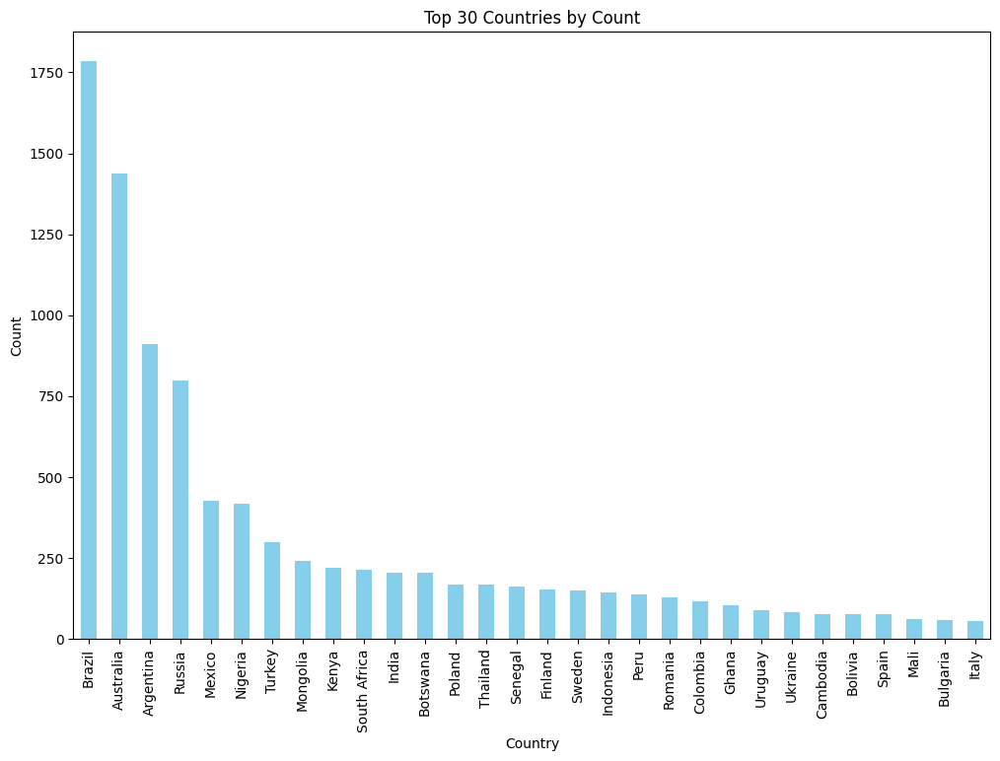

In [13]:
import matplotlib.pyplot as plt

# Plot the bar chart
plt.figure(figsize=(12, 8))
country_counts = df['country'].value_counts()
country_counts.head(30).plot(kind='bar', color='skyblue')
plt.title('Top 30 Countries by Count')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()


In [14]:
country_counts = df['country'].value_counts()
pd.set_option('display.max_rows', None) 
country_counts

country
Brazil                      1786
Australia                   1438
Argentina                    912
Russia                       799
Mexico                       428
Nigeria                      417
Turkey                       299
Mongolia                     240
Kenya                        220
South Africa                 214
India                        206
Botswana                     205
Poland                       169
Thailand                     167
Senegal                      163
Finland                      154
Sweden                       149
Indonesia                    144
Peru                         139
Romania                      128
Colombia                     116
Ghana                        103
Uruguay                       90
Ukraine                       83
Cambodia                      78
Bolivia                       78
Spain                         77
Mali                          62
Bulgaria                      57
Italy                         56
Hu

In [15]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('coords_with_country.csv')

# Count unique values
unique_country_count = df['country'].nunique()
print(f"Number of unique countries: {unique_country_count}")



Number of unique countries: 87


In [16]:
import pandas as pd
import os

# Print columns of df_country to check available columns
df_country = pd.read_csv('coords_with_country.csv')
print(df_country.columns)

# Create 'image_filename' if not present
df_country['image_filename'] = df_country.index.map(lambda x: f'{x}.jpg')


Index(['latitude', 'longitude', 'location', 'newlocation', 'country'], dtype='object')


In [17]:
df_country.sample(10)

,latitude,longitude,location,newlocation,country,image_filename
7994,-18.026420,125.333771,"Great Northern Highway, Mount Hardman WA, Aust...","Great Northern Highway, Mount Hardman WA, Aust...",Australia,7994.jpg
7677,-32.633230,116.907517,"York - Williams Road, WA, Australia","York Williams Road, WA, Australia",Australia,7677.jpg
3305,-41.030023,145.606682,"1193 Preolenna Road, Moorleah TAS 7325, Australia","1193 Preolenna Road, Moorleah TAS 7325, Australia",Australia,3305.jpg
5190,10.616004,7.228736,"unnamed road, Kunai, Kaduna State, Nigeria","unnamed road, Kunai, Kaduna State, Nigeria",Nigeria,5190.jpg
996,-23.563154,23.069767,"unnamed road, Botswana","unnamed road, Botswana",Botswana,996.jpg
6424,-41.278687,-68.949649,"Ruta Nacional 23, Departamento Veinticinco de ...","Ruta Nacional 23, Departamento Veinticinco de ...",Argentina,6424.jpg
2049,51.431705,28.830670,"М-21, Korosten Raion, Dubovyi Hai, Zhytomyr Ob...","M21, Korosten Raion, Dubovyi Hai, Zhytomyr Obl...",Ukraine,2049.jpg
5434,-32.670822,-53.635082,"Ruta 18, Cerro Largo, Uruguay","Ruta 18, Cerro Largo, Uruguay",Uruguay,5434.jpg
7915,-25.628546,119.191522,"Great Northern Highway, Peak Hill WA, Australia","Great Northern Highway, Peak Hill WA, Australia",Australia,7915.jpg
6650,-17.811055,-63.178537,"Tercer Anillo Interno, Santa Cruz de la Sierra...","Tercer Anillo Interno, Santa Cruz de la Sierra...",Bolivia,6650.jpg


In [18]:
import numpy as np
import scipy
import tensorflow as tf
import matplotlib.pyplot as plt


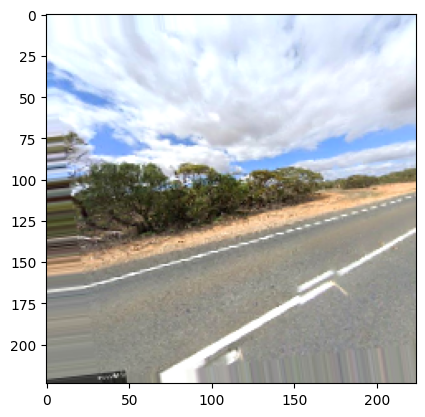

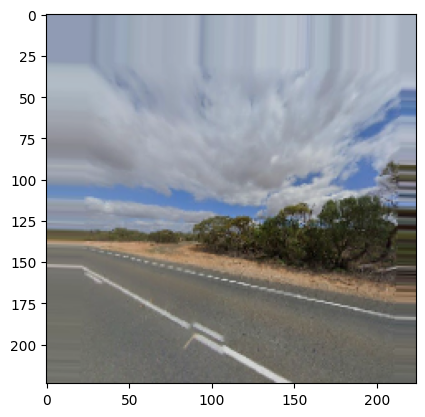

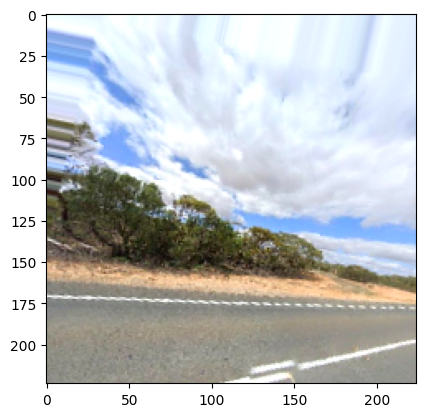

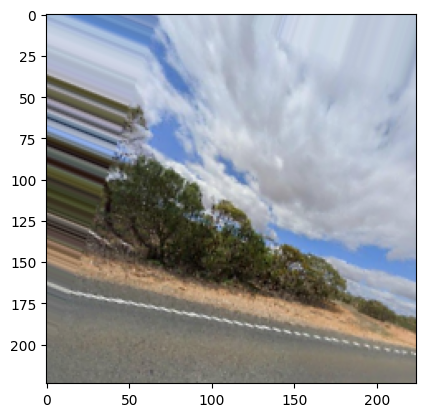

In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# Create an instance of ImageDataGenerator with supported augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=20,          
    width_shift_range=0.2,      
    height_shift_range=0.2,     
    shear_range=0.2,            
    zoom_range=0.2,             
    horizontal_flip=True,       
    brightness_range=[0.8, 1.2], 
    fill_mode='nearest'         
)

# Example: Load and augment an image
img_path = 'sorted_dataset/Australia/4.png'  
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)

# Generate and display augmented images
i = 0
for batch in datagen.flow(x, batch_size=1):
    augmented_image = batch[0].astype(np.uint8)  
    plt.figure(i)
    plt.imshow(augmented_image)
    i += 1
    if i % 4 == 0:
        break
plt.show()


In [19]:
# Create 'image_filename' if not present
if 'image_filename' not in df_country.columns:
    df_country['image_filename'] = df_country.index.map(lambda x: f'{x}.png')  # Adjust the extension if needed

# Save the DataFrame to ensure changes are preserved
df_country.to_csv('coords_with_country.csv', index=False)


In [49]:
import pandas as pd
import os

# Load the DataFrame
df_country = pd.read_csv('coords_with_country.csv')

# Filter the DataFrame to include only Brazil, Russia, Argentina, and Australia
selected_countries = ['Brazil', 'Russia', 'Argentina', 'Australia']
df_filtered = df_country[df_country['country'].isin(selected_countries)]

# Ensure image filenames use the .png extension
df_filtered['image_filename'] = df_filtered['image_filename'].apply(lambda x: f"{os.path.splitext(x)[0]}.png")

# Display the first few rows to verify mapping
print(df_filtered[['image_filename', 'country']].head())

# Print all image files with their corresponding countries
for country, group in df_filtered.groupby('country'):
    print(f"Country: {country}")
    print(group[['image_filename']].head(), "\n")


  image_filename    country
1          1.png     Brazil
2          2.png     Brazil
4          4.png  Australia
5          5.png     Brazil
8          8.png     Brazil
Country: Argentina
   image_filename
13         13.png
22         22.png
28         28.png
29         29.png
45         45.png 

Country: Australia
   image_filename
4           4.png
9           9.png
17         17.png
25         25.png
37         37.png 

Country: Brazil
   image_filename
1           1.png
2           2.png
5           5.png
8           8.png
19         19.png 

Country: Russia
   image_filename
16         16.png
23         23.png
48         48.png
67         67.png
75         75.png 



C:\Users\ASUS\AppData\Local\Temp\ipykernel_8108\1347056380.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['image_filename'] = df_filtered['image_filename'].apply(lambda x: f"{os.path.splitext(x)[0]}.png")


In [1]:
# import os
# import pandas as pd
# import numpy as np
# from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
# import tensorflow as tf
# import shutil
# import random

# # Load DataFrame
# df_country = pd.read_csv('coords_with_country.csv')

# # Ensure image filenames use the .png extension and are in lowercase
# df_country['image_filename'] = df_country['image_filename'].apply(lambda x: f"{os.path.splitext(x)[0].lower()}.png")

# # Define dataset directory and output directory
# dataset_dir = 'dataset'
# output_dir = 'sorted_dataset'
# os.makedirs(output_dir, exist_ok=True)

# # Create country directories in output directory
# for country in df_country['country'].str.lower().unique():
#     country_dir = os.path.join(output_dir, country.capitalize())
#     os.makedirs(country_dir, exist_ok=True)

# # Move images to respective country folders
# for index, row in df_country.iterrows():
#     country = row['country'].lower()
#     img_filename = row['image_filename']
#     src_img_path = os.path.join(dataset_dir, img_filename)
#     dst_img_path = os.path.join(output_dir, country.capitalize(), img_filename)
    
#     if os.path.exists(src_img_path):
#         shutil.move(src_img_path, dst_img_path)
#     else:
#         print(f"Image not found: {src_img_path}")

# # Get image counts per country
# image_counts = df_country['country'].value_counts()

# # Define countries for augmentation
# countries_to_augment = image_counts[image_counts < 1000].index.tolist()

# # Create ImageDataGenerator instance
# datagen = ImageDataGenerator(
#     rotation_range=20,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     shear_range=0.2,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     brightness_range=[0.8, 1.2],
#     fill_mode='nearest'
# )

# # Custom function to apply additional augmentations
# def custom_augment(image):
#     image = tf.image.random_contrast(image, 0.8, 1.2)
#     image = tf.image.random_saturation(image, 0.8, 1.2)
#     image = tf.image.random_hue(image, 0.1)
#     return image

# # Process countries to augment
# for country in countries_to_augment:
#     country_images = df_country[df_country['country'].str.lower() == country.lower()]
#     country_dir = os.path.join(output_dir, country.capitalize())

#     num_original_images = len(country_images)
#     total_needed = 1000 - num_original_images
#     num_augmented = 0  # Counter for augmented images

#     # Shuffle the original image indices
#     shuffled_indices = list(range(num_original_images))
#     random.shuffle(shuffled_indices)

#     print(f"Processing country: {country.capitalize()}")

#     while num_augmented < total_needed:
#         for index in shuffled_indices:
#             row = country_images.iloc[index]
#             img_filename = row['image_filename']
#             img_path = os.path.join(output_dir, country.capitalize(), img_filename)
#             if not os.path.exists(img_path):
#                 print(f"Image not found: {img_path}")
#                 continue

#             try:
#                 # Load the image for augmentation
#                 img = load_img(img_path, target_size=(640, 640))
#                 x = img_to_array(img)
#                 x = np.expand_dims(x, axis=0)

#                 # Generate and save augmented images
#                 augmentations_per_image = 0
#                 for batch in datagen.flow(x, batch_size=1):
#                     augmented_image = custom_augment(tf.convert_to_tensor(batch[0]))

#                     # Construct new image filename
#                     new_filename = f"{os.path.splitext(img_filename)[0]}_aug_{num_augmented}.png"
#                     new_img_path = os.path.join(country_dir, new_filename)
#                     tf.keras.preprocessing.image.save_img(new_img_path, augmented_image.numpy())

#                     augmentations_per_image += 1
#                     num_augmented += 1

#                     if num_augmented >= total_needed or augmentations_per_image >= 5:  # limit to 5 augmentations per image
#                         break

#             except Exception as e:
#                 print(f"Error processing image {img_path}: {e}")

#             if num_augmented >= total_needed:
#                 break

#     print(f"Augmented images for {country.capitalize()}: {num_augmented} images")

# print("Image moving and augmentation complete.")


In [24]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import tensorflow as tf
import random

# Load DataFrame
df_country = pd.read_csv('coords_with_country.csv')

# Ensure image filenames use the .png extension and are in lowercase
df_country['image_filename'] = df_country['image_filename'].apply(lambda x: f"{os.path.splitext(x)[0].lower()}.png")

# Define the directory for the sorted dataset
sorted_dataset_dir = 'sorted_dataset'

# List of valid countries
valid_countries = ['brazil', 'australia', 'russia', 'argentina']

# Filter DataFrame to include only the valid countries
df_country = df_country[df_country['country'].str.lower().isin(valid_countries)]

# Get image counts per country
image_counts = {country: len(os.listdir(os.path.join(sorted_dataset_dir, country.capitalize())))
                for country in valid_countries}

# Define target number of images
target_count = 2000
max_augmentations_per_image = 5  # Maximum augmentations per image

# Create ImageDataGenerator instance
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

# Custom function to apply additional augmentations
def custom_augment(image):
    image = tf.image.random_contrast(image, 0.8, 1.2)
    image = tf.image.random_saturation(image, 0.8, 1.2)
    image = tf.image.random_hue(image, 0.1)
    return image

# Process countries to augment
for country in valid_countries:
    country_dir = os.path.join(sorted_dataset_dir, country.capitalize())
    
    if not os.path.exists(country_dir):
        print(f"Directory not found: {country_dir}")
        continue

    count = image_counts[country]
    
    if count < target_count:
        num_to_augment = target_count - count
        
        # Track augmentations for each image
        augmentations_per_image = {}
        
        country_images = [f for f in os.listdir(country_dir) if os.path.isfile(os.path.join(country_dir, f))]
        random.shuffle(country_images)  # Shuffle the images

        print(f"Processing country: {country.capitalize()}")

        for img_filename in country_images:
            if num_to_augment <= 0:
                break
            
            img_path = os.path.join(country_dir, img_filename)
            if not os.path.exists(img_path):
                print(f"Image not found: {img_path}")
                continue

            try:
                # Load the image for augmentation
                img = load_img(img_path, target_size=(640, 640))
                x = img_to_array(img)
                x = np.expand_dims(x, axis=0)

                # Initialize augmentation count for this image if not already set
                if img_filename not in augmentations_per_image:
                    augmentations_per_image[img_filename] = 0
                
                # Generate and save augmented images
                for batch in datagen.flow(x, batch_size=1):
                    if augmentations_per_image[img_filename] >= max_augmentations_per_image:
                        break
                    
                    augmented_image = custom_augment(tf.convert_to_tensor(batch[0]))

                    # Construct new image filename
                    new_filename = f"{os.path.splitext(img_filename)[0]}_aug_{augmentations_per_image[img_filename]}.png"
                    new_img_path = os.path.join(country_dir, new_filename)
                    tf.keras.preprocessing.image.save_img(new_img_path, augmented_image.numpy())

                    augmentations_per_image[img_filename] += 1
                    num_to_augment -= 1
                    if num_to_augment <= 0:
                        break

            except Exception as e:
                print(f"Error processing image {img_path}: {e}")

        print(f"Augmented images for {country.capitalize()}: {target_count - num_to_augment} images")

print("Image augmentation complete.")


Processing country: Brazil
Augmented images for Brazil: 2000 images
Processing country: Australia
Augmented images for Australia: 2000 images
Processing country: Russia
Augmented images for Russia: 2000 images
Processing country: Argentina
Augmented images for Argentina: 2000 images
Image augmentation complete.


In [1]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Define the mapping from country names to class indices
index_to_class = {0: 'Argentina', 1: 'Australia', 2: 'Brazil', 3: 'Russia'}
class_to_index = {v: k for k, v in index_to_class.items()}

# Define the function to get image paths and labels
def get_image_paths_and_labels(dataset_dir):
    image_paths = []
    labels = []
    for country in os.listdir(dataset_dir):
        country_dir = os.path.join(dataset_dir, country)
        for img in os.listdir(country_dir):
            image_paths.append(os.path.join(country_dir, img))
            labels.append(country)
    return image_paths, labels

# Example usage of the function
dataset_directory = 'sorted_dataset'
image_paths, labels = get_image_paths_and_labels(dataset_directory)

# Encode labels as integers
labels_encoded = [class_to_index[label] for label in labels]

# Decode labels for DataFrame
labels_decoded = [index_to_class[label] for label in labels_encoded]

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(image_paths, labels_encoded, test_size=0.2, stratify=labels_encoded)

# Further split the training set into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train)

# Initialize ImageDataGenerators without validation_split
datagen_train = ImageDataGenerator(rescale=1./255)
datagen_val = ImageDataGenerator(rescale=1./255)

# Define functions for preprocessing and predicting
from tensorflow.keras.preprocessing import image

def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img_array

def predict_image(model, img_path, index_to_class):
    img_array = preprocess_image(img_path)
    predictions = model.predict(img_array)
    predicted_index = np.argmax(predictions[0])
    return index_to_class.get(predicted_index, "Unknown")


In [2]:
import pandas as pd

# Load the DataFrame used for training
df_train = pd.DataFrame({'filename': X_train, 'class': [index_to_class[label] for label in y_train]})

# Print some examples
print(df_train.sample(10))

# Check if labels match image filenames
for i in range(10):
    img_path = df_train['filename'].iloc[i]
    label = df_train['class'].iloc[i]
    print(f"Image: {img_path}, Label: {label}")


                                     filename      class
90             sorted_dataset\Russia\9239.png     Russia
2623  sorted_dataset\Argentina\2823_aug_3.png  Argentina
223         sorted_dataset\Australia\9052.png  Australia
2953        sorted_dataset\Argentina\4240.png  Argentina
4764           sorted_dataset\Brazil\6905.png     Brazil
3506           sorted_dataset\Russia\6063.png     Russia
4236           sorted_dataset\Brazil\7484.png     Brazil
593            sorted_dataset\Brazil\5825.png     Brazil
189            sorted_dataset\Brazil\5589.png     Brazil
1614           sorted_dataset\Brazil\5878.png     Brazil
Image: sorted_dataset\Russia\6504_aug_4.png, Label: Russia
Image: sorted_dataset\Russia\7441.png, Label: Russia
Image: sorted_dataset\Australia\7026_aug_3.png, Label: Australia
Image: sorted_dataset\Australia\5976.png, Label: Australia
Image: sorted_dataset\Brazil\1008_aug_2.png, Label: Brazil
Image: sorted_dataset\Russia\8756_aug_3.png, Label: Russia
Image: sorted_datas

In [3]:
import pandas as pd

def create_dataframe(filenames):
    labels = [extract_class_from_filename(f) for f in filenames]
    # Convert labels to class names (strings)
    class_labels = [class_names[label] if label is not None else None for label in labels]
    return pd.DataFrame({'filename': filenames, 'class': class_labels})


# Create DataFrames with correct paths
train_df = pd.DataFrame({'filename': X_train,
                          'class': [index_to_class[label] for label in y_train]})

val_df = pd.DataFrame({'filename': X_val,
                        'class': [index_to_class[label] for label in y_val]})

test_df = pd.DataFrame({'filename': X_test,
                         'class': [index_to_class[label] for label in y_test]})

# Print DataFrame to verify paths
print(train_df.head())
print(val_df.head())
print(test_df.head())


                                  filename      class
0     sorted_dataset\Russia\6504_aug_4.png     Russia
1           sorted_dataset\Russia\7441.png     Russia
2  sorted_dataset\Australia\7026_aug_3.png  Australia
3        sorted_dataset\Australia\5976.png  Australia
4     sorted_dataset\Brazil\1008_aug_2.png     Brazil
                                  filename      class
0        sorted_dataset\Australia\7942.png  Australia
1        sorted_dataset\Argentina\6667.png  Argentina
2  sorted_dataset\Australia\5306_aug_3.png  Australia
3            sorted_dataset\Brazil\879.png     Brazil
4        sorted_dataset\Argentina\9590.png  Argentina
                                  filename      class
0     sorted_dataset\Russia\6184_aug_0.png     Russia
1  sorted_dataset\Argentina\2609_aug_2.png  Argentina
2           sorted_dataset\Russia\8232.png     Russia
3        sorted_dataset\Australia\3121.png  Australia
4           sorted_dataset\Russia\7126.png     Russia


In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator(rescale=1./255)

# Define the ImageDataGenerator for validation (no augmentation, only rescaling)
val_datagen = ImageDataGenerator(rescale=1./255)

# Define the ImageDataGenerator for testing (no augmentation, only rescaling)
test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    classes=['Argentina', 'Australia', 'Brazil', 'Russia']  # specify the class labels
)

val_gen = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    classes=['Argentina', 'Australia', 'Brazil', 'Russia']  # specify the class labels
)

test_gen = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    classes=['Argentina', 'Australia', 'Brazil', 'Russia']  # specify the class labels
)
print(f"Class indices in generator: {train_gen.class_indices}")


Found 5120 validated image filenames belonging to 4 classes.
Found 1280 validated image filenames belonging to 4 classes.
Found 1600 validated image filenames belonging to 4 classes.
Class indices in generator: {'Argentina': 0, 'Australia': 1, 'Brazil': 2, 'Russia': 3}


In [5]:
print("Class indices in training generator:", train_gen.class_indices)
print("Class indices in validation generator:", val_gen.class_indices)


Class indices in training generator: {'Argentina': 0, 'Australia': 1, 'Brazil': 2, 'Russia': 3}
Class indices in validation generator: {'Argentina': 0, 'Australia': 1, 'Brazil': 2, 'Russia': 3}


In [6]:
import pandas as pd

# Paths to your images
base_path = ''

# Create DataFrames
train_df = pd.DataFrame({'filename': [base_path + path for path in X_train],
                          'class': [index_to_class[label] for label in y_train]})

val_df = pd.DataFrame({'filename': [base_path + path for path in X_val],
                        'class': [index_to_class[label] for label in y_val]})

test_df = pd.DataFrame({'filename': [base_path + path for path in X_test],
                         'class': [index_to_class[label] for label in y_test]})

# Print DataFrames to verify paths and labels
print(train_df.sample(12))
print(val_df.sample(12))
print(test_df.sample(12))


                                     filename      class
2476     sorted_dataset\Russia\4346_aug_1.png     Russia
1993        sorted_dataset\Australia\1571.png  Australia
2466        sorted_dataset\Argentina\8376.png  Argentina
1806     sorted_dataset\Russia\2253_aug_1.png     Russia
3475  sorted_dataset\Argentina\1308_aug_0.png  Argentina
816            sorted_dataset\Brazil\2267.png     Brazil
3465        sorted_dataset\Argentina\3111.png  Argentina
2746        sorted_dataset\Argentina\4332.png  Argentina
64             sorted_dataset\Brazil\6910.png     Brazil
3033  sorted_dataset\Argentina\4090_aug_2.png  Argentina
3100        sorted_dataset\Australia\1323.png  Australia
3186           sorted_dataset\Brazil\1520.png     Brazil
                                     filename      class
994      sorted_dataset\Russia\1451_aug_1.png     Russia
1168           sorted_dataset\Brazil\8938.png     Brazil
317            sorted_dataset\Brazil\2262.png     Brazil
90          sorted_dataset\Aust

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Get a batch of images and labels from the training generator
batch_images, batch_labels = next(train_gen)

# Convert class indices to class names
index_to_class = {v: k for k, v in train_gen.class_indices.items()}

# Print filenames and corresponding true labels
print("Sample images and their labels:")
for i in range(len(batch_images)):
    # The filename can be retrieved from the `train_gen.filenames` attribute
    filename = train_gen.filenames[train_gen.index_array[i]]
    true_label_index = batch_labels[i]
    true_label_name = index_to_class[true_label_index]
    
    print(f"Filename: {filename}, True Label Index: {true_label_index}, True Label Name: {true_label_name}")



Sample images and their labels:
Filename: sorted_dataset\Argentina\8409.png, True Label Index: 0.0, True Label Name: Argentina
Filename: sorted_dataset\Argentina\5062.png, True Label Index: 0.0, True Label Name: Argentina
Filename: sorted_dataset\Argentina\7836_aug_0.png, True Label Index: 0.0, True Label Name: Argentina
Filename: sorted_dataset\Australia\3228_aug_4.png, True Label Index: 1.0, True Label Name: Australia
Filename: sorted_dataset\Argentina\7797.png, True Label Index: 0.0, True Label Name: Argentina
Filename: sorted_dataset\Russia\6074_aug_0.png, True Label Index: 3.0, True Label Name: Russia
Filename: sorted_dataset\Brazil\6300.png, True Label Index: 2.0, True Label Name: Brazil
Filename: sorted_dataset\Russia\6769.png, True Label Index: 3.0, True Label Name: Russia
Filename: sorted_dataset\Australia\3682.png, True Label Index: 1.0, True Label Name: Australia
Filename: sorted_dataset\Argentina\9341_aug_2.png, True Label Index: 0.0, True Label Name: Argentina
Filename: so

In [12]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the custom CNN model
def create_model():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(len(train_gen.class_indices), activation='softmax'))
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Combine train_df and val_df
combined_df = pd.concat([train_df, val_df], ignore_index=True)

# Extract file paths and labels
file_paths = combined_df['filename'].tolist()
labels = [class_to_index[label] for label in combined_df['class'].tolist()]

# Define the number of folds
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True)

fold_accuracies = []

for fold, (train_indices, val_indices) in enumerate(kf.split(file_paths)):
    print(f"Processing Fold {fold + 1}/{num_folds}")
    
    # Create training and validation data generators for this fold
    train_files = [file_paths[i] for i in train_indices]
    val_files = [file_paths[i] for i in val_indices]
    
    train_labels = [labels[i] for i in train_indices]
    val_labels = [labels[i] for i in val_indices]
    
    train_df_fold = pd.DataFrame({'filename': train_files, 'class': [index_to_class[label] for label in train_labels]})
    val_df_fold = pd.DataFrame({'filename': val_files, 'class': [index_to_class[label] for label in val_labels]})

    train_gen_fold = ImageDataGenerator(rescale=1./255).flow_from_dataframe(
        dataframe=train_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )

    val_gen_fold = ImageDataGenerator(rescale=1./255).flow_from_dataframe(
        dataframe=val_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )
    
    # Create and train the model
    model = create_model()
    history = model.fit(
        train_gen_fold,
        epochs=10,
        validation_data=val_gen_fold,
        verbose=1
    )
    
    # Evaluate the model on the validation set
    loss, accuracy = model.evaluate(val_gen_fold, verbose=1)
    fold_accuracies.append(accuracy)
    
    print(f"Fold {fold + 1} accuracy: {accuracy:.3f}")

# Print average accuracy across folds
print(f"Average cross-validation accuracy: {np.mean(fold_accuracies):.3f}")

# Finally, evaluate the model on the test set
test_gen = ImageDataGenerator(rescale=1./255).flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    classes=['Argentina', 'Australia', 'Brazil', 'Russia']
)

# Train the model on the entire combined dataset
final_model = create_model()
final_model.fit(
    ImageDataGenerator(rescale=1./255).flow_from_dataframe(
        dataframe=combined_df,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    ),
    epochs=10,
    verbose=1
)

# Evaluate the final model on the test set
test_loss, test_accuracy = final_model.evaluate(test_gen, verbose=1)
print(f"Test accuracy: {test_accuracy:.3f}")


Processing Fold 1/5
Found 5120 validated image filenames belonging to 4 classes.
Found 1280 validated image filenames belonging to 4 classes.


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 133s 802ms/step - accuracy: 0.3561 - loss: 1.6789 - val_accuracy: 0.5047 - val_loss: 1.1232
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 126s 777ms/step - accuracy: 0.5221 - loss: 1.0779 - val_accuracy: 0.5562 - val_loss: 1.0091
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 136s 840ms/step - accuracy: 0.5656 - loss: 0.9752 - val_accuracy: 0.5742 - val_loss: 1.0164
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - accuracy: 0.6505 - loss: 0.8464 - val_accuracy: 0.5773 - val_loss: 1.0120
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 175s 1s/step - accuracy: 0.7066 - loss: 0.6985 - val_accuracy: 0.5734 - val_loss: 1.1261
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 172s 1s/step - accuracy: 0.7857 - loss: 0.5441 - val_accuracy: 0.5977 - val_loss: 1.1034
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 167s 1s/step - accuracy: 0.8420 - loss: 0.4193 - val_accuracy: 0.5664 - val_loss: 1.3943
Epoch 8/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 165s 1s/step - accuracy: 0.8908 - loss: 0.3176 - val_accura

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 159s 976ms/step - accuracy: 0.3613 - loss: 1.4836 - val_accuracy: 0.4406 - val_loss: 1.2178
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 163s 1s/step - accuracy: 0.4868 - loss: 1.1722 - val_accuracy: 0.5055 - val_loss: 1.1214
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 167s 1s/step - accuracy: 0.5290 - loss: 1.0789 - val_accuracy: 0.5352 - val_loss: 1.0946
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 166s 1s/step - accuracy: 0.5761 - loss: 0.9802 - val_accuracy: 0.5445 - val_loss: 1.0460
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 166s 1s/step - accuracy: 0.6123 - loss: 0.9146 - val_accuracy: 0.5813 - val_loss: 0.9878
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 163s 1s/step - accuracy: 0.6646 - loss: 0.8160 - val_accuracy: 0.5789 - val_loss: 0.9922
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 162s 1s/step - accuracy: 0.7051 - loss: 0.7215 - val_accuracy: 0.5469 - val_loss: 1.1583
Epoch 8/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 183s 1s/step - accuracy: 0.7564 - loss: 0.6003 - val_accuracy: 0.

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - accuracy: 0.3483 - loss: 1.7330 - val_accuracy: 0.5055 - val_loss: 1.1250
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - accuracy: 0.5271 - loss: 1.0904 - val_accuracy: 0.5148 - val_loss: 1.0722
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - accuracy: 0.5904 - loss: 0.9787 - val_accuracy: 0.5648 - val_loss: 1.0374
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 184s 1s/step - accuracy: 0.6263 - loss: 0.8878 - val_accuracy: 0.5531 - val_loss: 1.0458
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 183s 1s/step - accuracy: 0.6756 - loss: 0.7734 - val_accuracy: 0.5703 - val_loss: 1.1035
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - accuracy: 0.7116 - loss: 0.6733 - val_accuracy: 0.5555 - val_loss: 1.1746
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 183s 1s/step - accuracy: 0.7870 - loss: 0.5326 - val_accuracy: 0.5664 - val_loss: 1.4167
Epoch 8/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 181s 1s/step - accuracy: 0.8348 - loss: 0.4382 - val_accuracy: 0.508

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 240s 1s/step - accuracy: 0.3577 - loss: 1.8462 - val_accuracy: 0.4992 - val_loss: 1.1423
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 236s 1s/step - accuracy: 0.5079 - loss: 1.1215 - val_accuracy: 0.5117 - val_loss: 1.0936
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 241s 1s/step - accuracy: 0.5682 - loss: 1.0263 - val_accuracy: 0.5695 - val_loss: 1.0283
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 239s 1s/step - accuracy: 0.6132 - loss: 0.9401 - val_accuracy: 0.5883 - val_loss: 0.9962
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 242s 2s/step - accuracy: 0.6345 - loss: 0.8714 - val_accuracy: 0.5656 - val_loss: 1.0044
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 238s 1s/step - accuracy: 0.6799 - loss: 0.7839 - val_accuracy: 0.5664 - val_loss: 0.9849
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 246s 2s/step - accuracy: 0.7445 - loss: 0.6425 - val_accuracy: 0.5430 - val_loss: 1.1446
Epoch 8/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 237s 1s/step - accuracy: 0.8118 - loss: 0.4924 - val_accuracy: 0.541

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 264s 2s/step - accuracy: 0.3669 - loss: 1.5236 - val_accuracy: 0.4352 - val_loss: 1.1813
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 222s 1s/step - accuracy: 0.5160 - loss: 1.0995 - val_accuracy: 0.5250 - val_loss: 1.0827
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 208s 1s/step - accuracy: 0.5815 - loss: 0.9805 - val_accuracy: 0.5766 - val_loss: 1.0061
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 206s 1s/step - accuracy: 0.6688 - loss: 0.8372 - val_accuracy: 0.5883 - val_loss: 0.9906
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 203s 1s/step - accuracy: 0.7017 - loss: 0.7254 - val_accuracy: 0.5398 - val_loss: 1.1341
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 209s 1s/step - accuracy: 0.7663 - loss: 0.5815 - val_accuracy: 0.5422 - val_loss: 1.2297
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 211s 1s/step - accuracy: 0.8318 - loss: 0.4310 - val_accuracy: 0.5508 - val_loss: 1.4090
Epoch 8/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 214s 1s/step - accuracy: 0.8843 - loss: 0.3173 - val_accuracy: 0.543

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Found 6400 validated image filenames belonging to 4 classes.
Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


200/200 ━━━━━━━━━━━━━━━━━━━━ 244s 1s/step - accuracy: 0.3534 - loss: 1.4468
Epoch 2/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 246s 1s/step - accuracy: 0.5247 - loss: 1.0906
Epoch 3/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 242s 1s/step - accuracy: 0.5695 - loss: 1.0048
Epoch 4/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 243s 1s/step - accuracy: 0.6015 - loss: 0.9243
Epoch 5/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 248s 1s/step - accuracy: 0.6439 - loss: 0.8481
Epoch 6/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 246s 1s/step - accuracy: 0.6953 - loss: 0.7302
Epoch 7/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 248s 1s/step - accuracy: 0.7559 - loss: 0.6199
Epoch 8/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 246s 1s/step - accuracy: 0.8088 - loss: 0.4858
Epoch 9/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 244s 1s/step - accuracy: 0.8464 - loss: 0.3865
Epoch 10/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 244s 1s/step - accuracy: 0.8814 - loss: 0.3244
50/50 ━━━━━━━━━━━━━━━━━━━━ 25s 506ms/step - accuracy: 0.5800 - loss: 1.3414
Test accuracy: 0.577


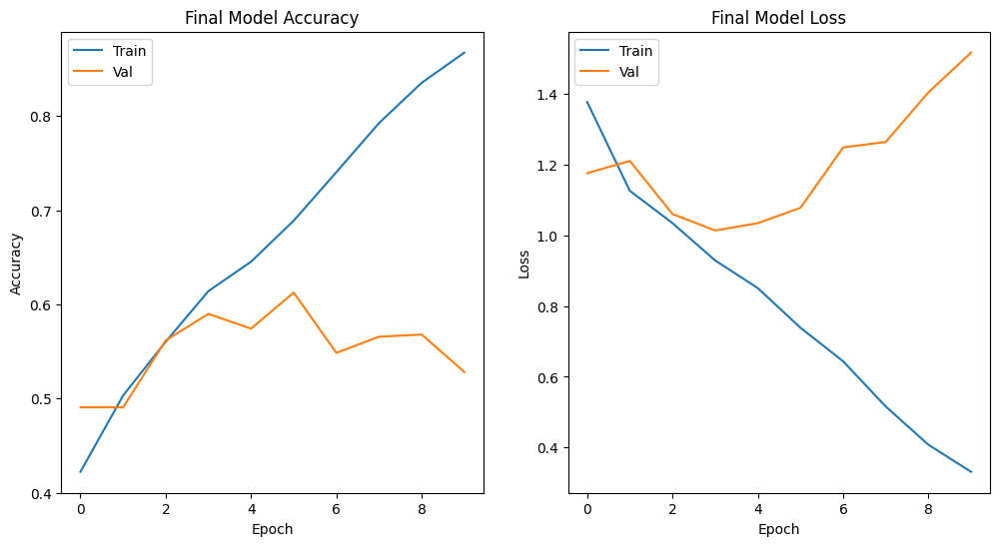

In [92]:
# Plot training and validation accuracy and loss for the final model
plt.figure(figsize=(12, 6))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Final Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Val'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Final Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Val'], loc='upper left')

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Filename: sorted_dataset\Russia\5456.png
True Label: Russia
Predicted Label: Argentina



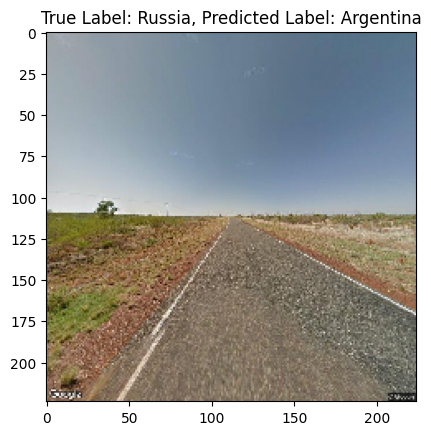

Filename: sorted_dataset\Australia\4486.png
True Label: Australia
Predicted Label: Australia



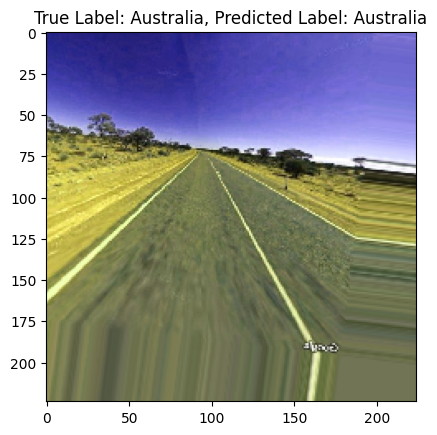

Filename: sorted_dataset\Argentina\54_aug_2.png
True Label: Argentina
Predicted Label: Argentina



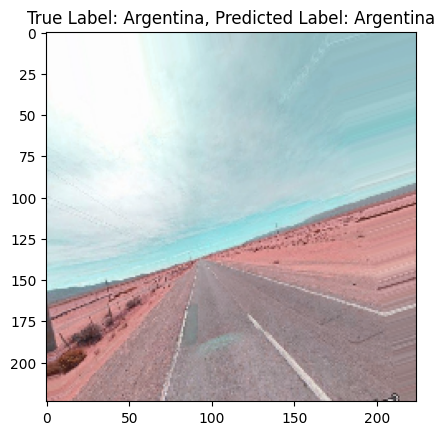

Filename: sorted_dataset\Australia\9598.png
True Label: Australia
Predicted Label: Australia



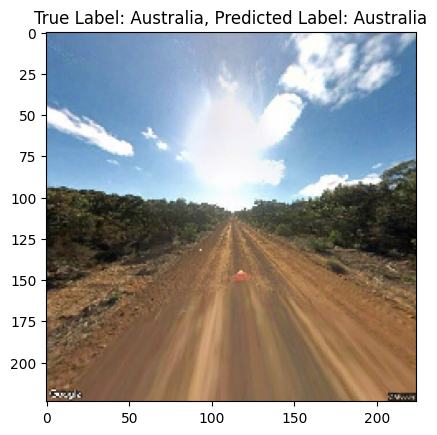

Filename: sorted_dataset\Argentina\8705_aug_1.png
True Label: Argentina
Predicted Label: Brazil



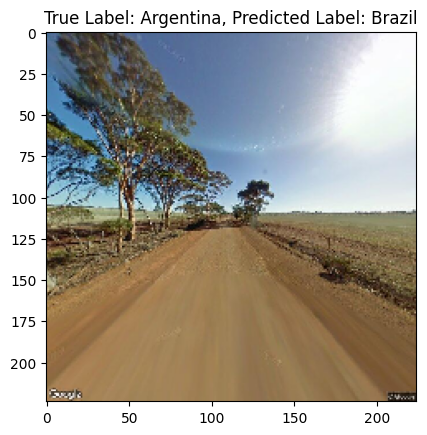

Filename: sorted_dataset\Argentina\2488_aug_4.png
True Label: Argentina
Predicted Label: Russia



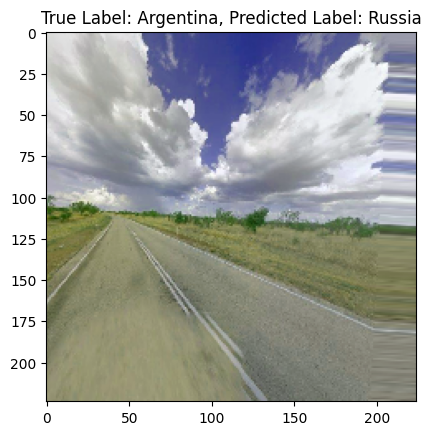

Filename: sorted_dataset\Argentina\8821_aug_3.png
True Label: Argentina
Predicted Label: Brazil



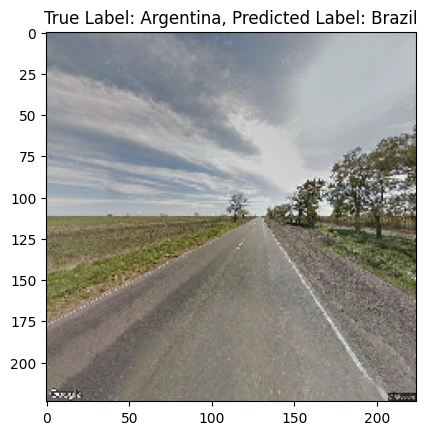

Filename: sorted_dataset\Argentina\565.png
True Label: Argentina
Predicted Label: Argentina



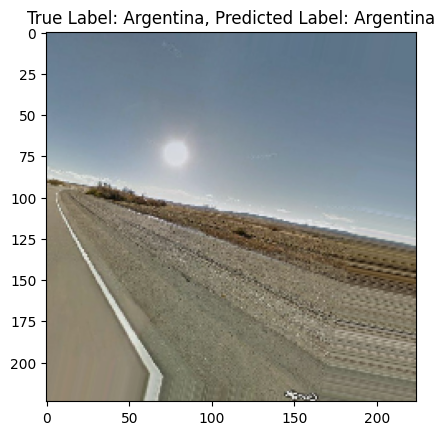

Filename: sorted_dataset\Brazil\1056.png
True Label: Brazil
Predicted Label: Australia



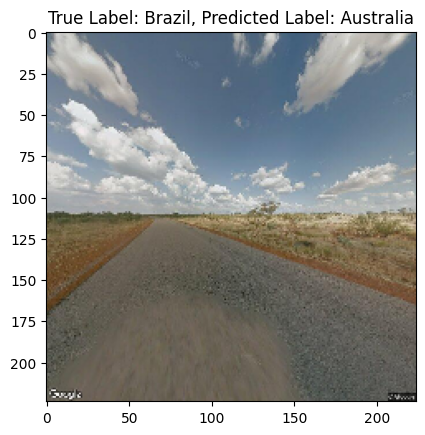

Filename: sorted_dataset\Argentina\2772_aug_4.png
True Label: Argentina
Predicted Label: Argentina



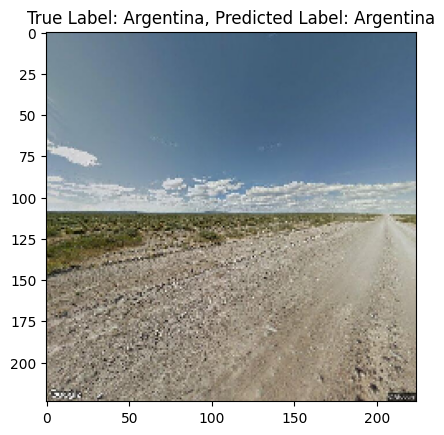

Filename: sorted_dataset\Russia\9707.png
True Label: Russia
Predicted Label: Australia



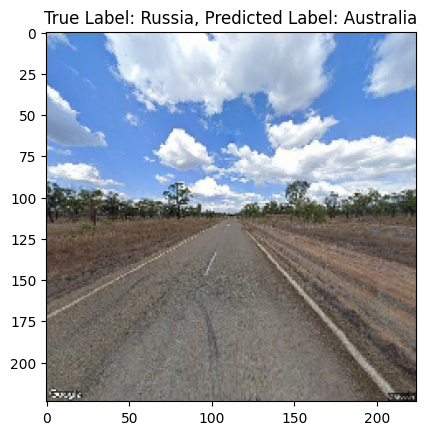

Filename: sorted_dataset\Argentina\4706.png
True Label: Argentina
Predicted Label: Argentina



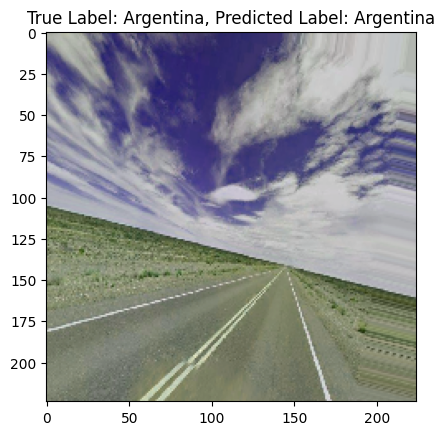

Filename: sorted_dataset\Argentina\8790_aug_2.png
True Label: Argentina
Predicted Label: Brazil



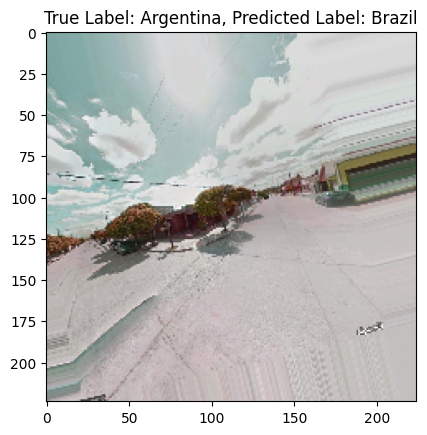

Filename: sorted_dataset\Russia\1890_aug_1.png
True Label: Russia
Predicted Label: Argentina



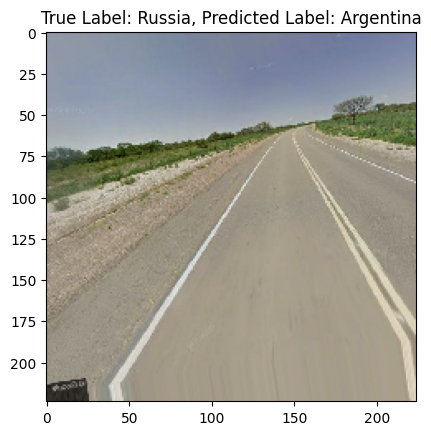

Filename: sorted_dataset\Argentina\5196_aug_3.png
True Label: Argentina
Predicted Label: Australia



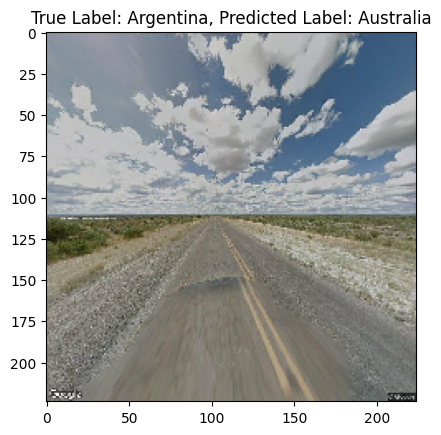

Filename: sorted_dataset\Argentina\6996_aug_0.png
True Label: Argentina
Predicted Label: Brazil



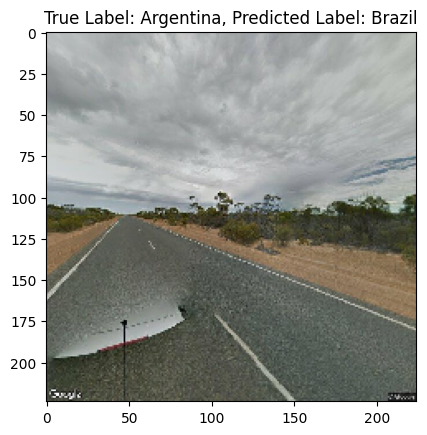

Filename: sorted_dataset\Australia\9861_aug_3.png
True Label: Australia
Predicted Label: Russia



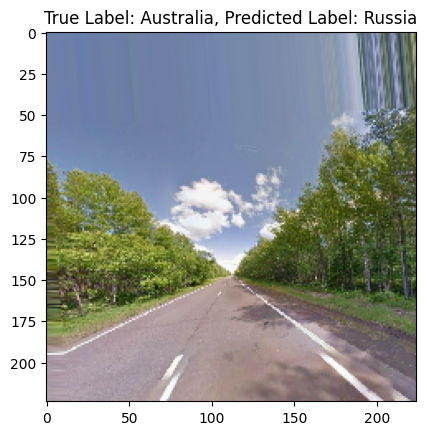

Filename: sorted_dataset\Australia\6543.png
True Label: Australia
Predicted Label: Russia



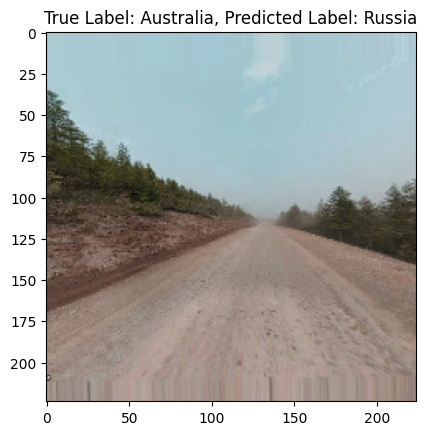

Filename: sorted_dataset\Argentina\8632_aug_0.png
True Label: Argentina
Predicted Label: Argentina



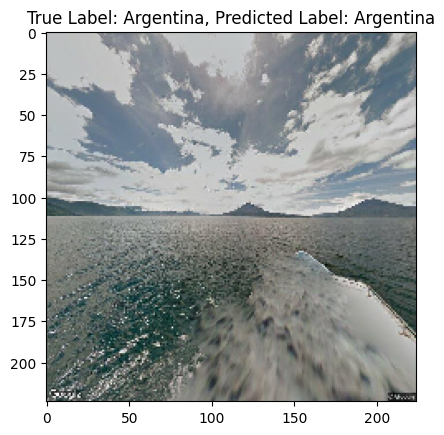

Filename: sorted_dataset\Australia\3799.png
True Label: Australia
Predicted Label: Brazil



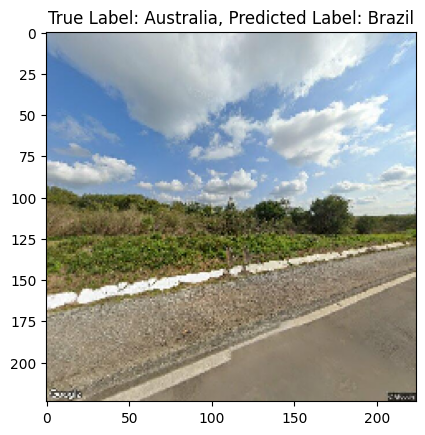

Filename: sorted_dataset\Brazil\9820.png
True Label: Brazil
Predicted Label: Australia



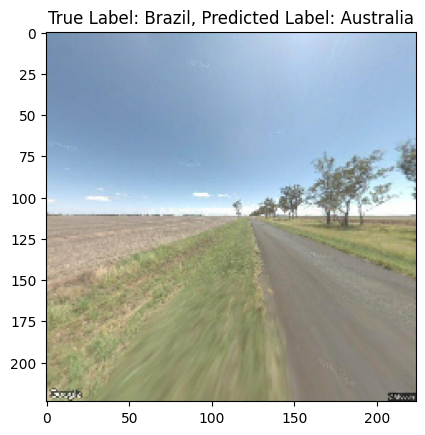

Filename: sorted_dataset\Australia\528.png
True Label: Australia
Predicted Label: Australia



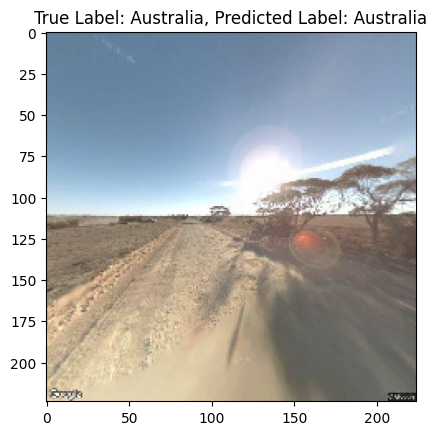

Filename: sorted_dataset\Brazil\6593_aug_4.png
True Label: Brazil
Predicted Label: Russia



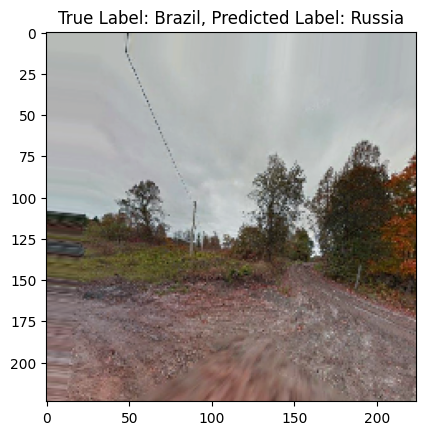

Filename: sorted_dataset\Australia\387_aug_3.png
True Label: Australia
Predicted Label: Brazil



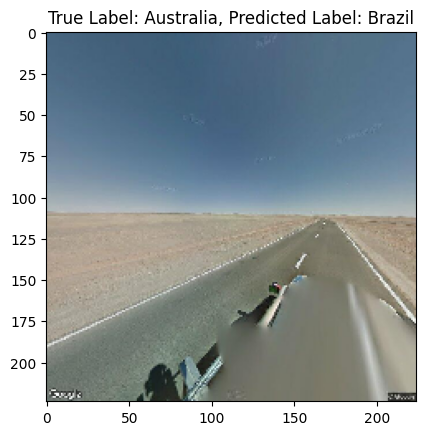

Filename: sorted_dataset\Argentina\9219_aug_1.png
True Label: Argentina
Predicted Label: Australia



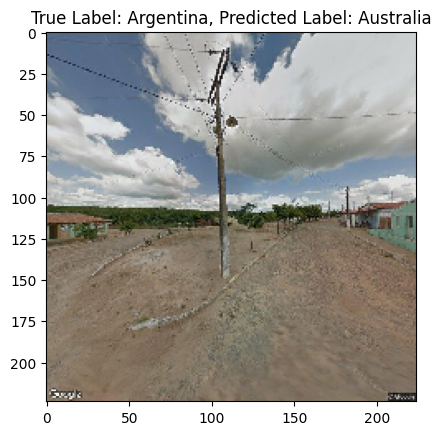

Filename: sorted_dataset\Brazil\8315.png
True Label: Brazil
Predicted Label: Russia



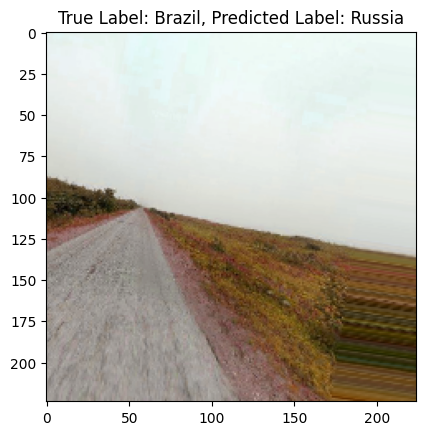

Filename: sorted_dataset\Argentina\2026.png
True Label: Argentina
Predicted Label: Australia



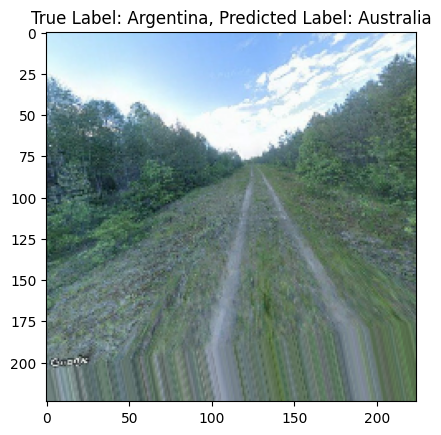

Filename: sorted_dataset\Brazil\1830.png
True Label: Brazil
Predicted Label: Australia



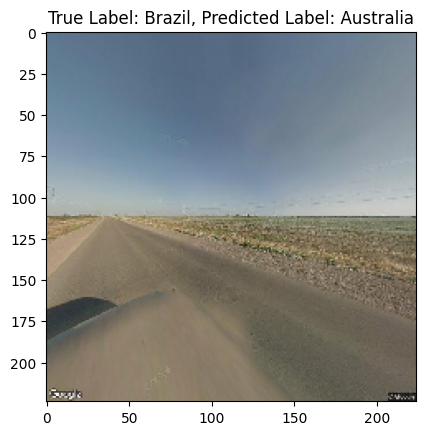

Filename: sorted_dataset\Argentina\683.png
True Label: Argentina
Predicted Label: Brazil



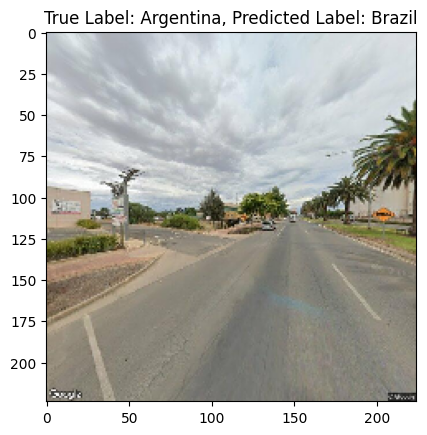

Filename: sorted_dataset\Argentina\665_aug_3.png
True Label: Argentina
Predicted Label: Russia



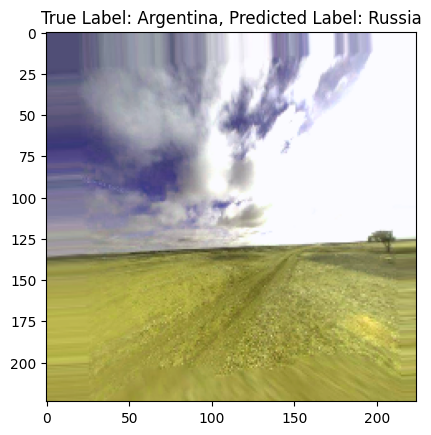

Filename: sorted_dataset\Russia\2186_aug_3.png
True Label: Russia
Predicted Label: Russia



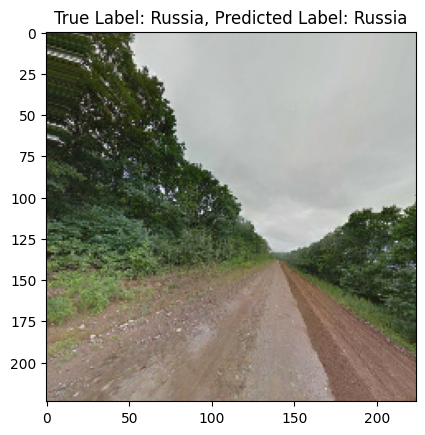

Filename: sorted_dataset\Argentina\3591_aug_3.png
True Label: Argentina
Predicted Label: Russia



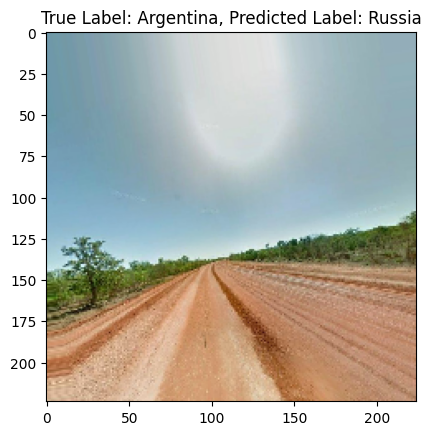

In [91]:
import numpy as np
import matplotlib.pyplot as plt

# Get a batch of images and labels from the test generator
test_images, test_labels = next(test_gen)

# Make predictions on the batch
predictions = model.predict(test_images)

# Get the predicted labels
predicted_labels = [class_names[np.argmax(prediction)] for prediction in predictions]

# Extract filenames based on generator's index_array
index_array = test_gen.index_array[:len(test_images)]
batch_filenames = [test_df['filename'].values[i] for i in index_array]

# Extract true labels from filenames
true_labels = [os.path.dirname(filename).split('/')[-1].split('\\')[-1] for filename in batch_filenames]

# Print filenames, true labels, and predicted labels for debugging
for i in range(len(batch_filenames)):
    print(f"Filename: {batch_filenames[i].split('/')[-1]}")
    print(f"True Label: {true_labels[i]}")
    print(f"Predicted Label: {predicted_labels[i]}")
    print("")

    plt.imshow(test_images[i])
    plt.title(f"True Label: {true_labels[i]}, Predicted Label: {predicted_labels[i]}")
    plt.show()

In [16]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

def create_model():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(256, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(len(train_gen.class_indices), activation='softmax'))
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Combine train_df and val_df
combined_df = pd.concat([train_df, val_df], ignore_index=True)

# Extract file paths and labels
file_paths = combined_df['filename'].tolist()
labels = [class_to_index[label] for label in combined_df['class'].tolist()]

# Define the number of folds
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True)

fold_accuracies = []

for fold, (train_indices, val_indices) in enumerate(kf.split(file_paths)):
    print(f"Processing Fold {fold + 1}/{num_folds}")
    
    # Create training and validation data generators for this fold
    train_files = [file_paths[i] for i in train_indices]
    val_files = [file_paths[i] for i in val_indices]
    
    train_labels = [labels[i] for i in train_indices]
    val_labels = [labels[i] for i in val_indices]
    
    train_df_fold = pd.DataFrame({'filename': train_files, 'class': [index_to_class[label] for label in train_labels]})
    val_df_fold = pd.DataFrame({'filename': val_files, 'class': [index_to_class[label] for label in val_labels]})

    train_gen_fold = train_datagen.flow_from_dataframe(
        dataframe=train_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )

    val_gen_fold = val_datagen.flow_from_dataframe(
        dataframe=val_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )
    
    # Create and train the model
    model = create_model()
    early_stopping = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2)
    
    history = model.fit(
        train_gen_fold,
        epochs=10,
        validation_data=val_gen_fold,
        verbose=1,
        callbacks=[early_stopping, lr_scheduler]
    )
    
    # Evaluate the model on the validation set
    loss, accuracy = model.evaluate(val_gen_fold, verbose=1)
    fold_accuracies.append(accuracy)
    
    print(f"Fold {fold + 1} accuracy: {accuracy:.3f}")

# Print average accuracy across folds
print(f"Average cross-validation accuracy: {np.mean(fold_accuracies):.3f}")

# Finally, evaluate the model on the test set
test_gen = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    classes=['Argentina', 'Australia', 'Brazil', 'Russia']
)

# Train the model on the entire combined dataset
final_model = create_model()
final_model.fit(
    train_datagen.flow_from_dataframe(
        dataframe=combined_df,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    ),
    epochs=10,
    verbose=1,
    callbacks=[early_stopping, lr_scheduler]
)

# Evaluate the final model on the test set
test_loss, test_accuracy = final_model.evaluate(test_gen, verbose=1)
print(f"Test accuracy: {test_accuracy:.3f}")


Processing Fold 1/5
Found 5120 validated image filenames belonging to 4 classes.
Found 1280 validated image filenames belonging to 4 classes.


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 149s 913ms/step - accuracy: 0.3232 - loss: 1.3935 - val_accuracy: 0.3953 - val_loss: 1.2215 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 202s 1s/step - accuracy: 0.3804 - loss: 1.2966 - val_accuracy: 0.4719 - val_loss: 1.1957 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 236s 1s/step - accuracy: 0.4780 - loss: 1.1604 - val_accuracy: 0.5430 - val_loss: 1.0419 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 230s 1s/step - accuracy: 0.5519 - loss: 1.0508 - val_accuracy: 0.5672 - val_loss: 1.0040 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 229s 1s/step - accuracy: 0.5832 - loss: 0.9789 - val_accuracy: 0.5625 - val_loss: 1.0381 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 241s 1s/step - accuracy: 0.6112 - loss: 0.9530 - val_accuracy: 0.5898 - val_loss: 0.9676 - learning_rate: 0.0010
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 219s 1s/step - accuracy: 0.6291 - loss: 0.8747 - v

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 218s 1s/step - accuracy: 0.3177 - loss: 1.3609 - val_accuracy: 0.4516 - val_loss: 1.1819 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 219s 1s/step - accuracy: 0.4433 - loss: 1.2195 - val_accuracy: 0.4773 - val_loss: 1.1450 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 225s 1s/step - accuracy: 0.4927 - loss: 1.1568 - val_accuracy: 0.5430 - val_loss: 1.0903 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 251s 2s/step - accuracy: 0.5219 - loss: 1.1106 - val_accuracy: 0.5664 - val_loss: 1.0516 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 258s 2s/step - accuracy: 0.5378 - loss: 1.0584 - val_accuracy: 0.5867 - val_loss: 0.9914 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 259s 2s/step - accuracy: 0.5784 - loss: 0.9950 - val_accuracy: 0.5891 - val_loss: 0.9842 - learning_rate: 0.0010
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 257s 2s/step - accuracy: 0.5845 - loss: 0.9589 - val_

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 266s 2s/step - accuracy: 0.3260 - loss: 1.4545 - val_accuracy: 0.4016 - val_loss: 1.2680 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 263s 2s/step - accuracy: 0.4708 - loss: 1.1673 - val_accuracy: 0.5266 - val_loss: 1.1091 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 262s 2s/step - accuracy: 0.5482 - loss: 1.0604 - val_accuracy: 0.5430 - val_loss: 1.0745 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 263s 2s/step - accuracy: 0.5678 - loss: 1.0082 - val_accuracy: 0.5211 - val_loss: 1.0833 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 262s 2s/step - accuracy: 0.5957 - loss: 0.9732 - val_accuracy: 0.5406 - val_loss: 1.0398 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 267s 2s/step - accuracy: 0.6211 - loss: 0.9218 - val_accuracy: 0.5609 - val_loss: 1.0120 - learning_rate: 0.0010
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 263s 2s/step - accuracy: 0.6270 - loss: 0.8713 - val_

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 268s 2s/step - accuracy: 0.2871 - loss: 1.4133 - val_accuracy: 0.4656 - val_loss: 1.2179 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 268s 2s/step - accuracy: 0.4609 - loss: 1.1917 - val_accuracy: 0.5359 - val_loss: 1.0661 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 267s 2s/step - accuracy: 0.5251 - loss: 1.1017 - val_accuracy: 0.5195 - val_loss: 1.1070 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 265s 2s/step - accuracy: 0.5730 - loss: 1.0119 - val_accuracy: 0.5742 - val_loss: 1.0049 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 267s 2s/step - accuracy: 0.5762 - loss: 0.9650 - val_accuracy: 0.5750 - val_loss: 0.9933 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 265s 2s/step - accuracy: 0.6140 - loss: 0.9026 - val_accuracy: 0.5742 - val_loss: 0.9765 - learning_rate: 0.0010
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 268s 2s/step - accuracy: 0.6697 - loss: 0.8091 - val_

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 273s 2s/step - accuracy: 0.2911 - loss: 1.4077 - val_accuracy: 0.3812 - val_loss: 1.2983 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 271s 2s/step - accuracy: 0.4067 - loss: 1.2702 - val_accuracy: 0.4539 - val_loss: 1.2284 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 277s 2s/step - accuracy: 0.4415 - loss: 1.2218 - val_accuracy: 0.4570 - val_loss: 1.1860 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 362s 2s/step - accuracy: 0.4336 - loss: 1.1974 - val_accuracy: 0.4945 - val_loss: 1.1414 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 277s 2s/step - accuracy: 0.5094 - loss: 1.1169 - val_accuracy: 0.4828 - val_loss: 1.1428 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 263s 2s/step - accuracy: 0.5287 - loss: 1.0714 - val_accuracy: 0.5539 - val_loss: 1.0420 - learning_rate: 0.0010
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 261s 2s/step - accuracy: 0.5594 - loss: 1.0029 - val_

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Found 6400 validated image filenames belonging to 4 classes.
Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


200/200 ━━━━━━━━━━━━━━━━━━━━ 353s 2s/step - accuracy: 0.2768 - loss: 1.4453 - learning_rate: 0.0010
Epoch 2/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\callbacks\early_stopping.py:155: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)
C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\callbacks\callback_list.py:96: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


200/200 ━━━━━━━━━━━━━━━━━━━━ 374s 2s/step - accuracy: 0.4515 - loss: 1.2210 - learning_rate: 0.0010
Epoch 3/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 366s 2s/step - accuracy: 0.5040 - loss: 1.1238 - learning_rate: 0.0010
Epoch 4/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 342s 2s/step - accuracy: 0.5393 - loss: 1.0471 - learning_rate: 0.0010
Epoch 5/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 298s 1s/step - accuracy: 0.5857 - loss: 0.9795 - learning_rate: 0.0010
Epoch 6/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 299s 1s/step - accuracy: 0.6181 - loss: 0.9240 - learning_rate: 0.0010
Epoch 7/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 303s 2s/step - accuracy: 0.6300 - loss: 0.8904 - learning_rate: 0.0010
Epoch 8/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 303s 2s/step - accuracy: 0.6410 - loss: 0.8402 - learning_rate: 0.0010
Epoch 9/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 297s 1s/step - accuracy: 0.6755 - loss: 0.7774 - learning_rate: 0.0010
Epoch 10/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 271s 1s/step - accuracy: 0.7087 - loss: 0.7164 - learning_rate: 0.0010
50/50 ━━━━━

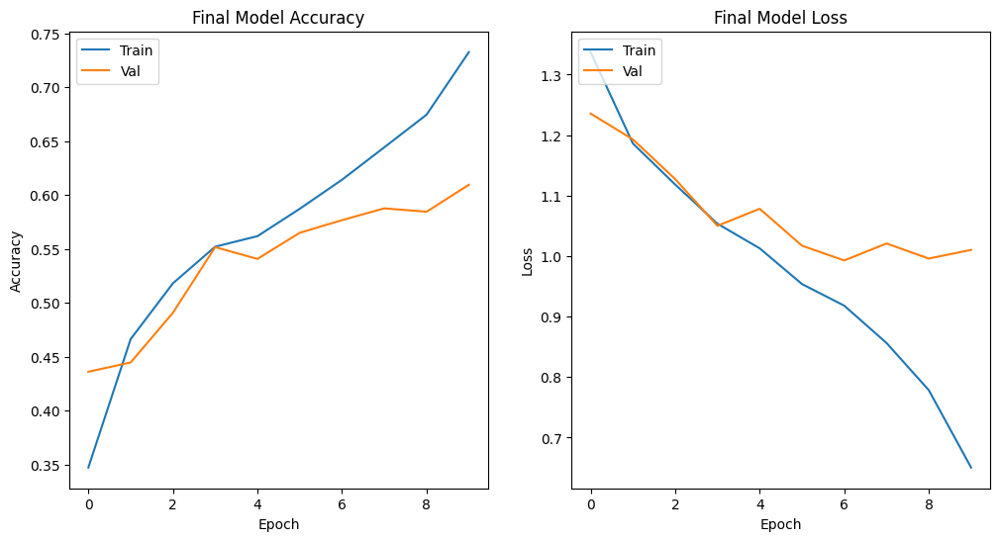

In [95]:
# Plot training and validation accuracy and loss for the final model
plt.figure(figsize=(12, 6))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Final Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Val'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Final Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Val'], loc='upper left')

In [9]:
import os
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.model_selection import KFold
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential

# Constants and parameters
num_folds = 3
stop_after_folds = 2  # Stop after fold 2/3 if accuracy doesn't improve much
accuracy_improvement_threshold = 0.01  # Minimum required improvement in accuracy
model_checkpoint_path = 'model_checkpoints/vgg16_model_checkpoint_fold_{fold}_epoch_{epoch}.weights.h5'
progress_file = "vgg16_progress.txt"
batch_size = 32
epochs = 10  # Adjust this to your preference

# Function to save progress
def save_progress(fold, epoch):
    with open(progress_file, "w") as f:
        f.write(f"{fold},{epoch}")

# Function to load progress
def load_progress():
    if os.path.exists(progress_file):
        with open(progress_file, "r") as f:
            fold, epoch = map(int, f.read().strip().split(","))
        return fold, epoch
    else:
        return 0, 0  # Start from the beginning if no progress is saved

# Create and compile the VGG16 model
def create_pretrained_model():
    # Load the VGG16 model pre-trained on ImageNet
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    
    # Add custom layers on top of the base model
    model = Sequential([
        base_model,
        Flatten(),
        Dense(1024, activation='relu'),
        Dense(512, activation='relu'),
        Dense(4, activation='softmax')  # Assuming 4 classes (Argentina, Australia, Brazil, Russia)
    ])
    
    # Compile the model
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Load last completed fold and epoch
start_fold, start_epoch = load_progress()

# Assuming train_df and val_df are your training and validation dataframes
# Combine train_df and val_df for cross-validation
combined_df = pd.concat([train_df, val_df], ignore_index=True)

# Extract file paths and labels
file_paths = combined_df['filename'].tolist()
labels = [class_to_index[label] for label in combined_df['class'].tolist()]

# Prepare data generators
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

previous_val_accuracy = 0  # Initialize previous accuracy for improvement check
val_accuracy_list = []  # To store validation accuracies for each fold

for fold, (train_indices, val_indices) in enumerate(kf.split(file_paths)):
    if fold < start_fold:
        continue  # Skip already completed folds
    
    print(f"Processing Fold {fold + 1}/{num_folds}")

    # Create training and validation dataframes for this fold
    train_files = [file_paths[i] for i in train_indices]
    val_files = [file_paths[i] for i in val_indices]
    
    train_labels = [labels[i] for i in train_indices]
    val_labels = [labels[i] for i in val_indices]
    
    train_df_fold = pd.DataFrame({'filename': train_files, 'class': [index_to_class[label] for label in train_labels]})
    val_df_fold = pd.DataFrame({'filename': val_files, 'class': [index_to_class[label] for label in val_labels]})

    # Create generators for this fold
    train_gen_fold = train_datagen.flow_from_dataframe(
        dataframe=train_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )

    val_gen_fold = val_datagen.flow_from_dataframe(
        dataframe=val_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )
    
    # Create and compile the model
    model = create_pretrained_model()

    # Check if we should load weights
    if fold == start_fold and start_epoch > 0:
        checkpoint_to_load = model_checkpoint_path.format(fold=fold, epoch=start_epoch)
        if os.path.exists(checkpoint_to_load):
            model.load_weights(checkpoint_to_load)
    
    early_stopping = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2)
    checkpoint = ModelCheckpoint(
        model_checkpoint_path.format(fold=fold, epoch='{epoch}'), 
        save_weights_only=True, 
        save_best_only=True, 
        monitor='val_loss',
        verbose=1
    )
    
    for epoch in range(start_epoch, epochs):
        print(f"Epoch {epoch + 1}/{epochs} for fold {fold + 1}")
        
        history = model.fit(
            train_gen_fold,
            validation_data=val_gen_fold,
            epochs=epoch + 1,
            initial_epoch=epoch,
            callbacks=[early_stopping, lr_scheduler, checkpoint]
        )

        save_progress(fold, epoch + 1)  # Save progress after each epoch

    start_epoch = 0  # Reset epoch count for next fold

    # Evaluate the model on the validation set
    val_loss, val_accuracy = model.evaluate(val_gen_fold)
    print(f"Fold {fold + 1} accuracy: {val_accuracy:.3f}")
    val_accuracy_list.append(val_accuracy)  # Save the validation accuracy for this fold

    # Check accuracy improvement
    if fold == stop_after_folds - 1:
        improvement = val_accuracy - previous_val_accuracy
        if improvement < accuracy_improvement_threshold:
            print("Stopping training early as accuracy improvement is below threshold.")
            break
    
    previous_val_accuracy = val_accuracy  # Update previous accuracy for the next fold

# Calculate average validation accuracy across all folds
average_val_accuracy = np.mean(val_accuracy_list)
print(f"Average cross-validation accuracy: {average_val_accuracy:.3f}")

# Finally, evaluate the model on the test set
test_gen = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='sparse',
    classes=['Argentina', 'Australia', 'Brazil', 'Russia']
)

test_loss, test_accuracy = model.evaluate(test_gen)
print(f"Test accuracy: {test_accuracy:.3f}")

# Training complete, clean up
if os.path.exists(progress_file):
    os.remove(progress_file)


Processing Fold 1/3
Found 4266 validated image filenames belonging to 4 classes.
Found 2134 validated image filenames belonging to 4 classes.


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


67/67 ━━━━━━━━━━━━━━━━━━━━ 204s 3s/step - accuracy: 0.2507 - loss: 1.4676
Fold 1 accuracy: 0.254
Processing Fold 2/3
Found 4267 validated image filenames belonging to 4 classes.
Found 2133 validated image filenames belonging to 4 classes.
Epoch 1/10 for fold 2


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step - accuracy: 0.2280 - loss: 1.9250 
Epoch 1: val_loss improved from inf to 1.38633, saving model to model_checkpoints/vgg16_model_checkpoint_fold_1_epoch_1.weights.h5
134/134 ━━━━━━━━━━━━━━━━━━━━ 3197s 24s/step - accuracy: 0.2280 - loss: 1.9224 - val_accuracy: 0.2504 - val_loss: 1.3863 - learning_rate: 0.0010
Epoch 2/10 for fold 2
Epoch 2/2
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 22s/step - accuracy: 0.2523 - loss: 1.3863 
Epoch 2: val_loss did not improve from 1.38633
134/134 ━━━━━━━━━━━━━━━━━━━━ 3315s 25s/step - accuracy: 0.2522 - loss: 1.3863 - val_accuracy: 0.2504 - val_loss: 1.3864 - learning_rate: 0.0010
Epoch 3/10 for fold 2
Epoch 3/3
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 22s/step - accuracy: 0.2428 - loss: 1.3864 
Epoch 3: val_loss did not improve from 1.38633
134/134 ━━━━━━━━━━━━━━━━━━━━ 3325s 25s/step - accuracy: 0.2428 - loss: 1.3864 - val_accuracy: 0.2452 - val_loss: 1.3864 - learning_rate: 0.0010
Epoch 4/10 for fold 2
Epoch 4/4
134/134 ━━━━━━━━━━━

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


50/50 ━━━━━━━━━━━━━━━━━━━━ 302s 6s/step - accuracy: 0.2569 - loss: 1.3864
Test accuracy: 0.250


In [8]:
import os
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.model_selection import KFold
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential

# Constants and parameters
num_folds = 3
stop_after_folds = 2  # Stop after fold 2/3 if accuracy doesn't improve much
accuracy_improvement_threshold = 0.01  # Minimum required improvement in accuracy
model_checkpoint_path = 'model_checkpoints/resnet50_model_checkpoint_fold_{fold}_epoch_{epoch}.weights.h5'
progress_file = "resnet50_progress.txt"
batch_size = 32
epochs = 10  # Adjust this to your preference

# Function to save progress
def save_progress(fold, epoch):
    with open(progress_file, "w") as f:
        f.write(f"{fold},{epoch}")

# Function to load progress
def load_progress():
    if os.path.exists(progress_file):
        with open(progress_file, "r") as f:
            fold, epoch = map(int, f.read().strip().split(","))
        return fold, epoch
    else:
        return 0, 0  # Start from the beginning if no progress is saved

# Create and compile the ResNet50 model
def create_pretrained_model():
    # Load the ResNet50 model pre-trained on ImageNet
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    
    # Add custom layers on top of the base model
    model = Sequential([
        base_model,
        Flatten(),
        Dense(1024, activation='relu'),
        Dense(512, activation='relu'),
        Dense(4, activation='softmax')  # Assuming 4 classes (Argentina, Australia, Brazil, Russia)
    ])
    
    # Compile the model
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Load last completed fold and epoch
start_fold, start_epoch = load_progress()

# Assuming train_df and val_df are your training and validation dataframes
# Combine train_df and val_df for cross-validation
combined_df = pd.concat([train_df, val_df], ignore_index=True)

# Extract file paths and labels
file_paths = combined_df['filename'].tolist()
labels = [class_to_index[label] for label in combined_df['class'].tolist()]

# Prepare data generators
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

previous_val_accuracy = 0  # Initialize previous accuracy for improvement check
val_accuracy_list = []  # To store validation accuracies for each fold

for fold, (train_indices, val_indices) in enumerate(kf.split(file_paths)):
    if fold < start_fold:
        continue  # Skip already completed folds
    
    print(f"Processing Fold {fold + 1}/{num_folds}")

    # Create training and validation dataframes for this fold
    train_files = [file_paths[i] for i in train_indices]
    val_files = [file_paths[i] for i in val_indices]
    
    train_labels = [labels[i] for i in train_indices]
    val_labels = [labels[i] for i in val_indices]
    
    train_df_fold = pd.DataFrame({'filename': train_files, 'class': [index_to_class[label] for label in train_labels]})
    val_df_fold = pd.DataFrame({'filename': val_files, 'class': [index_to_class[label] for label in val_labels]})

    # Create generators for this fold
    train_gen_fold = train_datagen.flow_from_dataframe(
        dataframe=train_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )

    val_gen_fold = val_datagen.flow_from_dataframe(
        dataframe=val_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )
    
    # Create and compile the model
    model = create_pretrained_model()

    # Ensure the model is built before loading weights
    if fold == start_fold and start_epoch > 0:
        checkpoint_to_load = model_checkpoint_path.format(fold=fold, epoch=start_epoch)
        if os.path.exists(checkpoint_to_load):
            # Build the model by running a dummy forward pass
            model.predict(np.zeros((1, 224, 224, 3)))  # Adjust input shape as necessary
            model.load_weights(checkpoint_to_load)
    
    early_stopping = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2)
    checkpoint = ModelCheckpoint(
        model_checkpoint_path.format(fold=fold, epoch='{epoch}'), 
        save_weights_only=True, 
        save_best_only=True, 
        monitor='val_loss',
        verbose=1
    )
    
    for epoch in range(start_epoch, epochs):
        print(f"Epoch {epoch + 1}/{epochs} for fold {fold + 1}")
        
        history = model.fit(
            train_gen_fold,
            validation_data=val_gen_fold,
            epochs=epoch + 1,
            initial_epoch=epoch,
            callbacks=[early_stopping, lr_scheduler, checkpoint]
        )

        save_progress(fold, epoch + 1)  # Save progress after each epoch

    start_epoch = 0  # Reset epoch count for next fold

    # Evaluate the model on the validation set
    val_loss, val_accuracy = model.evaluate(val_gen_fold)
    print(f"Fold {fold + 1} accuracy: {val_accuracy:.3f}")
    val_accuracy_list.append(val_accuracy)  # Save the validation accuracy for this fold

    # Check accuracy improvement
    if fold == stop_after_folds - 1:
        improvement = val_accuracy - previous_val_accuracy
        if improvement < accuracy_improvement_threshold:
            print("Stopping training early as accuracy improvement is below threshold.")
            break
    
    previous_val_accuracy = val_accuracy  # Update previous accuracy for the next fold

# Calculate average validation accuracy across all folds
average_val_accuracy = np.mean(val_accuracy_list)
print(f"Average cross-validation accuracy: {average_val_accuracy:.3f}")

# Finally, evaluate the model on the test set
test_gen = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='sparse',
    classes=['Argentina', 'Australia', 'Brazil', 'Russia']
)

test_loss, test_accuracy = model.evaluate(test_gen)
print(f"Test accuracy: {test_accuracy:.3f}")

# Training complete, clean up
if os.path.exists(progress_file):
    os.remove(progress_file)


Processing Fold 3/3
Found 4267 validated image filenames belonging to 4 classes.
Found 2133 validated image filenames belonging to 4 classes.
Epoch 4/10 for fold 3
Epoch 4/4


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step - accuracy: 0.3487 - loss: 10.3457 
Epoch 4: val_loss improved from inf to 1.92535, saving model to model_checkpoints/resnet50_model_checkpoint_fold_2_epoch_4.weights.h5
134/134 ━━━━━━━━━━━━━━━━━━━━ 3051s 22s/step - accuracy: 0.3490 - loss: 10.2952 - val_accuracy: 0.2977 - val_loss: 1.9254 - learning_rate: 0.0010
Epoch 5/10 for fold 3
Epoch 5/5
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 26s/step - accuracy: 0.5341 - loss: 1.1037 
Epoch 5: val_loss improved from 1.92535 to 1.39618, saving model to model_checkpoints/resnet50_model_checkpoint_fold_2_epoch_5.weights.h5
134/134 ━━━━━━━━━━━━━━━━━━━━ 3633s 27s/step - accuracy: 0.5342 - loss: 1.1034 - val_accuracy: 0.2597 - val_loss: 1.3962 - learning_rate: 0.0010
Epoch 6/10 for fold 3
Epoch 6/6
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.6211 - loss: 0.8901 
Epoch 6: val_loss did not improve from 1.39618
134/134 ━━━━━━━━━━━━━━━━━━━━ 3800s 28s/step - accuracy: 0.6212 - loss: 0.8900 - val_accuracy: 0.244

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


50/50 ━━━━━━━━━━━━━━━━━━━━ 174s 3s/step - accuracy: 0.4017 - loss: 1.7711
Test accuracy: 0.405


In [10]:
from tensorflow.keras.regularizers import l2
from sklearn.model_selection import KFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

def create_model():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3), kernel_regularizer=l2(0.01)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.01)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.01)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(256, (3, 3), activation='relu', kernel_regularizer=l2(0.01)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.01)))
    model.add(Dropout(0.6))  # Increased dropout rate
    model.add(Dense(len(train_gen.class_indices), activation='softmax'))
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model


In [17]:
import os
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.model_selection import KFold
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential

early_stopping = EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)  # Increased patience
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3)  # Adjusted patience and factor
# Combine train_df and val_df
combined_df = pd.concat([train_df, val_df], ignore_index=True)

# Extract file paths and labels
file_paths = combined_df['filename'].tolist()
labels = [class_to_index[label] for label in combined_df['class'].tolist()]

# Define the number of folds
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True)

fold_accuracies = []

for fold, (train_indices, val_indices) in enumerate(kf.split(file_paths)):
    print(f"Processing Fold {fold + 1}/{num_folds}")
    
    # Create training and validation data generators for this fold
    train_files = [file_paths[i] for i in train_indices]
    val_files = [file_paths[i] for i in val_indices]
    
    train_labels = [labels[i] for i in train_indices]
    val_labels = [labels[i] for i in val_indices]
    
    train_df_fold = pd.DataFrame({'filename': train_files, 'class': [index_to_class[label] for label in train_labels]})
    val_df_fold = pd.DataFrame({'filename': val_files, 'class': [index_to_class[label] for label in val_labels]})

    train_gen_fold = train_datagen.flow_from_dataframe(
        dataframe=train_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )

    val_gen_fold = val_datagen.flow_from_dataframe(
        dataframe=val_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )
    
    # Create and train the model
    model = create_model()
    
    history = model.fit(
        train_gen_fold,
        epochs=10,  # Increased number of epochs
        validation_data=val_gen_fold,
        verbose=1,
        callbacks=[early_stopping, lr_scheduler]
    )
    
    # Evaluate the model on the validation set
    loss, accuracy = model.evaluate(val_gen_fold, verbose=1)
    fold_accuracies.append(accuracy)
    
    print(f"Fold {fold + 1} accuracy: {accuracy:.3f}")

# Print average accuracy across folds
print(f"Average cross-validation accuracy: {np.mean(fold_accuracies):.3f}")

# Finally, evaluate the model on the test set
test_gen = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col='class',
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    classes=['Argentina', 'Australia', 'Brazil', 'Russia']
)

# Train the model on the entire combined dataset
final_model = create_model()
final_model.fit(
    train_datagen.flow_from_dataframe(
        dataframe=combined_df,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    ),
    epochs=20,  # Increased number of epochs
    verbose=1,
    callbacks=[early_stopping, lr_scheduler]
)

# Evaluate the final model on the test set
test_loss, test_accuracy = final_model.evaluate(test_gen, verbose=1)
print(f"Test accuracy: {test_accuracy:.3f}")


Processing Fold 1/5
Found 5120 validated image filenames belonging to 4 classes.
Found 1280 validated image filenames belonging to 4 classes.


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 156s 936ms/step - accuracy: 0.2961 - loss: 4.2198 - val_accuracy: 0.3281 - val_loss: 1.4916 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 155s 962ms/step - accuracy: 0.3223 - loss: 1.4724 - val_accuracy: 0.3500 - val_loss: 1.4011 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - accuracy: 0.3452 - loss: 1.4036 - val_accuracy: 0.3648 - val_loss: 1.3629 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 196s 1s/step - accuracy: 0.3533 - loss: 1.3787 - val_accuracy: 0.3898 - val_loss: 1.3680 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 196s 1s/step - accuracy: 0.3516 - loss: 1.3692 - val_accuracy: 0.4023 - val_loss: 1.3605 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 202s 1s/step - accuracy: 0.3663 - loss: 1.3547 - val_accuracy: 0.3742 - val_loss: 1.3540 - learning_rate: 0.0010
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 191s 1s/step - accuracy: 0.3666 - loss: 1.3399 

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 252s 2s/step - accuracy: 0.2597 - loss: 4.2215 - val_accuracy: 0.2672 - val_loss: 1.5021 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 251s 2s/step - accuracy: 0.3123 - loss: 1.4711 - val_accuracy: 0.3336 - val_loss: 1.3994 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 248s 2s/step - accuracy: 0.3203 - loss: 1.4164 - val_accuracy: 0.3367 - val_loss: 1.3762 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 251s 2s/step - accuracy: 0.3349 - loss: 1.3834 - val_accuracy: 0.3680 - val_loss: 1.3586 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 249s 2s/step - accuracy: 0.3320 - loss: 1.3733 - val_accuracy: 0.3492 - val_loss: 1.3585 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 247s 2s/step - accuracy: 0.3553 - loss: 1.3659 - val_accuracy: 0.3492 - val_loss: 1.3718 - learning_rate: 0.0010
40/40 ━━━━━━━━━━━━━━━━━━━━ 19s 469ms/step - accuracy: 0.2359 - loss: 1.5036
Fold 2 accuracy: 

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 253s 2s/step - accuracy: 0.2889 - loss: 4.3146 - val_accuracy: 0.3125 - val_loss: 1.5796 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 255s 2s/step - accuracy: 0.3253 - loss: 1.5207 - val_accuracy: 0.3570 - val_loss: 1.4439 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 255s 2s/step - accuracy: 0.3377 - loss: 1.4250 - val_accuracy: 0.3344 - val_loss: 1.4033 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 250s 2s/step - accuracy: 0.3392 - loss: 1.4000 - val_accuracy: 0.3383 - val_loss: 1.3866 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 246s 2s/step - accuracy: 0.3487 - loss: 1.3754 - val_accuracy: 0.3828 - val_loss: 1.3673 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 244s 2s/step - accuracy: 0.3760 - loss: 1.3685 - val_accuracy: 0.3672 - val_loss: 1.3604 - learning_rate: 0.0010
40/40 ━━━━━━━━━━━━━━━━━━━━ 19s 463ms/step - accuracy: 0.3114 - loss: 1.5787
Fold 3 accuracy: 

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 237s 1s/step - accuracy: 0.2687 - loss: 4.3987 - val_accuracy: 0.3133 - val_loss: 1.5375 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 233s 1s/step - accuracy: 0.3403 - loss: 1.5073 - val_accuracy: 0.3820 - val_loss: 1.4046 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 234s 1s/step - accuracy: 0.3658 - loss: 1.3936 - val_accuracy: 0.3820 - val_loss: 1.3466 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 237s 1s/step - accuracy: 0.3630 - loss: 1.3549 - val_accuracy: 0.3953 - val_loss: 1.3304 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 234s 1s/step - accuracy: 0.3748 - loss: 1.3415 - val_accuracy: 0.4094 - val_loss: 1.3182 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 235s 1s/step - accuracy: 0.3670 - loss: 1.3440 - val_accuracy: 0.3906 - val_loss: 1.3341 - learning_rate: 0.0010
40/40 ━━━━━━━━━━━━━━━━━━━━ 18s 457ms/step - accuracy: 0.2945 - loss: 1.5357
Fold 4 accuracy: 

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 234s 1s/step - accuracy: 0.2476 - loss: 4.4320 - val_accuracy: 0.2383 - val_loss: 1.5621 - learning_rate: 0.0010
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 233s 1s/step - accuracy: 0.2524 - loss: 1.5152 - val_accuracy: 0.2383 - val_loss: 1.4383 - learning_rate: 0.0010
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 237s 1s/step - accuracy: 0.2489 - loss: 1.4272 - val_accuracy: 0.2383 - val_loss: 1.4082 - learning_rate: 0.0010
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 237s 1s/step - accuracy: 0.2513 - loss: 1.4032 - val_accuracy: 0.2383 - val_loss: 1.3971 - learning_rate: 0.0010
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 230s 1s/step - accuracy: 0.2461 - loss: 1.3945 - val_accuracy: 0.2336 - val_loss: 1.3923 - learning_rate: 0.0010
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 209s 1s/step - accuracy: 0.2669 - loss: 1.3899 - val_accuracy: 0.2336 - val_loss: 1.3902 - learning_rate: 0.0010
40/40 ━━━━━━━━━━━━━━━━━━━━ 16s 398ms/step - accuracy: 0.2274 - loss: 1.5622
Fold 5 accuracy: 

C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Found 6400 validated image filenames belonging to 4 classes.
Epoch 1/20


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


200/200 ━━━━━━━━━━━━━━━━━━━━ 230s 1s/step - accuracy: 0.2504 - loss: 4.5368 - learning_rate: 0.0010
Epoch 2/20


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\callbacks\early_stopping.py:155: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)
C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\callbacks\callback_list.py:96: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


200/200 ━━━━━━━━━━━━━━━━━━━━ 225s 1s/step - accuracy: 0.2355 - loss: 1.5790 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 224s 1s/step - accuracy: 0.2527 - loss: 1.4558 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 220s 1s/step - accuracy: 0.2408 - loss: 1.4176 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 220s 1s/step - accuracy: 0.2490 - loss: 1.4021 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 221s 1s/step - accuracy: 0.2422 - loss: 1.3948 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 220s 1s/step - accuracy: 0.2435 - loss: 1.3910 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 220s 1s/step - accuracy: 0.2541 - loss: 1.3889 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 221s 1s/step - accuracy: 0.2511 - loss: 1.3878 - learning_rate: 0.0010
Epoch 10/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 231s 1s/step - accuracy: 0.2443 - loss: 1.3872 - learning_rate: 0.0010
Epoch 11/20

In [60]:
#Running the code for visualization

import os
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
from sklearn.model_selection import KFold

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3)

# Combine train_df and val_df into a single dataframe
combined_df = pd.concat([train_df, val_df], ignore_index=True)

# Extract file paths and labels
file_paths = combined_df['filename'].tolist()
labels = [class_to_index[label] for label in combined_df['class'].tolist()]

# Define the number of folds (KFold Cross-Validation)
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True)

# Train and validate the model using only the first fold
for fold, (train_indices, val_indices) in enumerate(kf.split(file_paths)):
    if fold != 0:  # Only process the first fold
        break

    print(f"Processing Fold {fold + 1}/{num_folds}")
    
    # Create training and validation data generators for this fold
    train_files = [file_paths[i] for i in train_indices]
    val_files = [file_paths[i] for i in val_indices]
    
    train_labels = [labels[i] for i in train_indices]
    val_labels = [labels[i] for i in val_indices]
    
    train_df_fold = pd.DataFrame({'filename': train_files, 'class': [index_to_class[label] for label in train_labels]})
    val_df_fold = pd.DataFrame({'filename': val_files, 'class': [index_to_class[label] for label in val_labels]})

    train_gen_fold = train_datagen.flow_from_dataframe(
        dataframe=train_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )

    val_gen_fold = val_datagen.flow_from_dataframe(
        dataframe=val_df_fold,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    )
    
    # Create and train the model for this single fold
    model = create_model()
    
    history = model.fit(
        train_gen_fold,
        epochs=2,  # Increased number of epochs
        validation_data=val_gen_fold,
        verbose=1,
        callbacks=[early_stopping, lr_scheduler]
    )
    
    # Evaluate the model on the validation set for this fold
    loss, accuracy = model.evaluate(val_gen_fold, verbose=1)
    print(f"Fold {fold + 1} accuracy: {accuracy:.3f}")

# After fold-based training, train the model on the entire combined dataset
final_model = create_model()

final_model.fit(
    train_datagen.flow_from_dataframe(
        dataframe=combined_df,
        x_col='filename',
        y_col='class',
        target_size=(224, 224),
        batch_size=32,
        class_mode='sparse',
        classes=['Argentina', 'Australia', 'Brazil', 'Russia']
    ),
    epochs=2,
    verbose=1,
    callbacks=[early_stopping, lr_scheduler]
)


Processing Fold 1/5
Found 5120 validated image filenames belonging to 4 classes.
Found 1280 validated image filenames belonging to 4 classes.


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/2


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 157s 946ms/step - accuracy: 0.2562 - loss: 4.1712 - val_accuracy: 0.2469 - val_loss: 1.4772 - learning_rate: 0.0010
Epoch 2/2
160/160 ━━━━━━━━━━━━━━━━━━━━ 158s 975ms/step - accuracy: 0.2483 - loss: 1.4499 - val_accuracy: 0.2359 - val_loss: 1.4093 - learning_rate: 0.0010
40/40 ━━━━━━━━━━━━━━━━━━━━ 14s 353ms/step - accuracy: 0.2376 - loss: 1.4093
Fold 1 accuracy: 0.236
Found 6400 validated image filenames belonging to 4 classes.
Epoch 1/2


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


200/200 ━━━━━━━━━━━━━━━━━━━━ 224s 1s/step - accuracy: 0.2672 - loss: 4.3144 - learning_rate: 0.0010
Epoch 2/2


C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\callbacks\early_stopping.py:155: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)
C:\Users\ASUS\.conda\envs\myenv\Lib\site-packages\keras\src\callbacks\callback_list.py:96: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


200/200 ━━━━━━━━━━━━━━━━━━━━ 229s 1s/step - accuracy: 0.3425 - loss: 1.5875 - learning_rate: 0.0010


In [61]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np

# Load the image from file
img_path = 'sorted_dataset/Australia/4.png'  # Replace with your image path
img = image.load_img(img_path, target_size=(224, 224))  # Resize image to match model's expected input size

# Convert the image to a numpy array
img_array = image.img_to_array(img)

# Add a batch dimension
img_array = np.expand_dims(img_array, axis=0)

# Preprocess the image for the model
img_array = preprocess_input(img_array)


In [62]:
# Predict the class of the image
predictions = final_model.predict(img_array)
predicted_class_index = np.argmax(predictions)
print(f"Predicted class index: {predicted_class_index}")

# Map the class index back to the class label
class_labels = ['Argentina', 'Australia', 'Brazil', 'Russia']
predicted_class_label = class_labels[predicted_class_index]
print(f"Predicted class label: {predicted_class_label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
Predicted class index: 3
Predicted class label: Russia


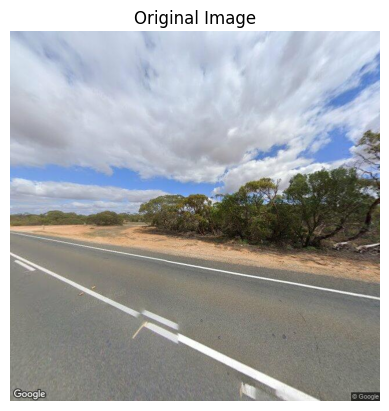

In [63]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np

# Load and display the original image
def display_image(img_path):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title('Original Image')
    plt.show()

# Path to the image
img_path = 'sorted_dataset/Australia/4.png'
display_image(img_path)


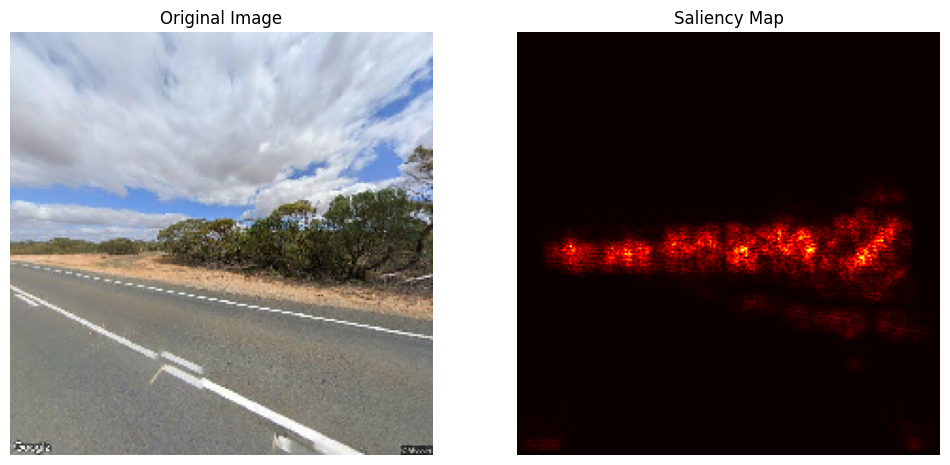

In [64]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import preprocess_input

# Function to preprocess the image for the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))  # Resize to match model's input size
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = preprocess_input(img_array)  # Preprocess image for VGG16
    return img_array

# Function to compute and visualize the saliency map
def compute_saliency_map(model, img_path):
    img_array = preprocess_image(img_path)
    img_array = tf.Variable(img_array, dtype=tf.float32)
    
    with tf.GradientTape() as tape:
        tape.watch(img_array)
        predictions = model(img_array)
        class_idx = tf.argmax(predictions[0])
        loss = predictions[0][class_idx]
    
    grads = tape.gradient(loss, img_array)
    saliency = tf.reduce_max(tf.abs(grads), axis=-1).numpy()[0]
    return saliency

# Function to display the original image and saliency map side by side
def display_image_and_saliency(img_path, model):
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img) / 255.0  # Normalize to [0, 1]
    
    # Compute saliency map
    saliency = compute_saliency_map(model, img_path)
    
    # Plotting
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # Display original image
    axes[0].imshow(img_array)
    axes[0].axis('off')
    axes[0].set_title('Original Image')
    
    # Display saliency map
    axes[1].imshow(saliency, cmap='hot')
    axes[1].axis('off')
    axes[1].set_title('Saliency Map')
    
    plt.show()

# Path to the image
img_path = 'sorted_dataset/Australia/4.png'

# Display image and saliency map
display_image_and_saliency(img_path, final_model)


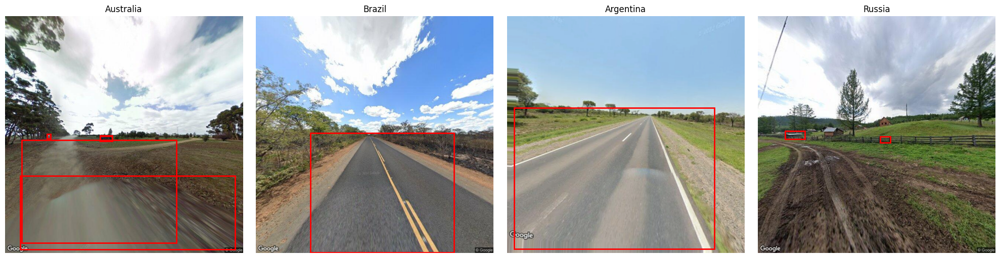

Cosine Similarity Matrix:
[[1.0000004  0.9975176  0.9924516  0.9962798 ]
 [0.9975176  0.99999976 0.992228   0.9960102 ]
 [0.9924516  0.992228   0.9999999  0.99045664]
 [0.9962798  0.9960102  0.99045664 0.99999994]]


In [26]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Load pre-trained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Function to detect objects and extract features
def detect_objects_and_extract_features(image_path):
    image = Image.open(image_path)
    image_tensor = F.to_tensor(image).unsqueeze(0)

    with torch.no_grad():
        # Run the image through the model
        predictions = model(image_tensor)

        # Extract the feature maps from the backbone
        features = model.backbone(image_tensor)
        
        # Take one of the feature maps from the OrderedDict (e.g., '0' for the first feature map)
        feature_map = features['0']
        
        # Compute the mean across the spatial dimensions (height and width) to create a feature vector
        feature_vector = feature_map.mean(dim=[2, 3]).squeeze().numpy()

    boxes = predictions[0]['boxes']
    labels = predictions[0]['labels']
    scores = predictions[0]['scores']

    return image, boxes, labels, scores, feature_vector

# Function to plot images side by side with bounding boxes and titles
def plot_images_side_by_side(images, boxes_list, titles):
    fig, axes = plt.subplots(1, len(images), figsize=(20, 5))

    for i, (image, boxes, title, ax) in enumerate(zip(images, boxes_list, titles, axes)):
        ax.imshow(image)

        # Add bounding boxes
        for box in boxes:
            rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        ax.set_title(title)
        ax.axis('off')  # Turn off the axis

    plt.tight_layout()
    plt.show()

# Paths to images with corresponding titles (countries)
image_paths = [
    "sorted_dataset/Australia/1003.png",
    "sorted_dataset/Brazil/1008.png",
    "sorted_dataset/Argentina/1013_aug_3.png",
    "sorted_dataset/Russia/1451.png"
]

titles = ["Australia", "Brazil", "Argentina", "Russia"]

# Detect objects and extract features for all images
features = []
images = []
boxes_list = []

for image_path in image_paths:
    image, boxes, labels, scores, feature_vector = detect_objects_and_extract_features(image_path)
    images.append(image)
    boxes_list.append(boxes)
    features.append(feature_vector)

# Plot images side by side with titles
plot_images_side_by_side(images, boxes_list, titles)

# Compute similarity between images
similarity_matrix = cosine_similarity(features)

print("Cosine Similarity Matrix:")
print(similarity_matrix)
